# Differential Accessibility between WT and KD within celltypes

In [ ]:
here::i_am("rna_atac/differential/ATAC.ipynb")

source(here::here("settings.R"))
source(here::here("utils.R"))

suppressPackageStartupMessages(library(ArchR))
suppressPackageStartupMessages(library(dplyr))
suppressPackageStartupMessages(library(edgeR))


BPPARAM <- BiocParallel::bpparam()
BPPARAM$workers = 21

addArchRThreads(24)

here() starts at /rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/code



In [ ]:
args = list()

# Metadata
args$metadata = file.path(io$basedir, 'results/rna_atac/clustering/metadata_celltype_annotated_v2.txt.gz')

# RNA_sce
args$rna_sce = file.path(io$basedir, 'processed/rna/SingleCellExperiment.rds')

# Archr
args$archr_directory = file.path(io$basedir, 'processed/atac/archR')

args$logFC_thr = 0.25
args$FDR_thr = 0.05

# outdir
args$outdir = file.path(io$basedir, 'results/rna_atac/differential/Accessibility/')
dir.create(args$outdir, recursive=TRUE, showWarnings =FALSE)

In [ ]:
# Load meta
meta = fread(args$metadata)[day!='D3'] %>% # remove D3 cells
    .[,celltype_genotype:=paste0(celltype_v2, '-', genotype)]

In [ ]:
# Functions
plot_enr_heatmap = function(enrichMotifs, ntop=25) {
    heatmapEM <- plotEnrichHeatmap(enrichMotifs, n = ntop, returnMatrix = TRUE)

    enriched.dt = melt(as.data.table(heatmapEM, keep.rownames=T) %>% setnames('rn', 'TF'), id.vars = c("TF")) %>%
        .[order(-value)] %>% .[,TF:=strsplit(TF, '_') %>% map_chr(1)]

    keep_tfs = enriched.dt %>% .[,variable:=factor(variable, levels=opts$celltype_levels )] %>% .[order(variable)] %>% .[, head(.SD, ntop),  by=variable] %>% .$TF   
    enriched.dt = enriched.dt[TF %in% keep_tfs] %>% .[order( -value)] %>% 
        #.[,TF:=strsplit(TF, '_') %>% map_chr(1)] %>%
         .[,TF:=factor(TF, levels=unique(keep_tfs))] %>%
        .[,variable:=factor(variable, levels=opts$celltype_levels )]
    
    p = ggplot(enriched.dt, aes(TF, variable, fill=value)) + 
    geom_tile(col='black') +
    scale_fill_gradient(low='white', high='darkblue', name='Norm. Enrichment -log10(P-adj) [0-max]') +
    theme_void() + theme(text=element_text(size=15), 
                         axis.text.x=element_text(angle=-90,hjust=0,vjust=0.5, size=15), 
                         axis.text.y=element_text(hjust=0),
                        legend.position='bottom')
p
    return(p)
}

#### Load Data

In [ ]:
ArchRProject <- loadArchRProject(args$archr_directory)[meta$cell]

## ArchR

#### Differential ChromVAR

In [20]:
# Differential chromVAR
differential_chromvar = function(x, test = 'wilcoxon', matrix = 'DeviationMatrix_CISBP'){
        message(x)
        tmp = ArchRProject[meta[celltype_v2==x]$cell]
        # Differential ChromVAR one v all
        diffMotif <- getMarkerFeatures(
            ArchRProj = tmp, 
            testMethod = test,
            binarize = FALSE,
            useMatrix = matrix,
            groupBy = "genotype",
              useGroups = 'KO',
              bgdGroups = 'WT',
            useSeqnames="z",
            verbose = F
        )

        tmp2 = data.table(motif = str_split(rowData(diffMotif)$name, '_') %>% map_chr(1),
                                      FDR = assay(diffMotif[,1], 'FDR')[[1]],
                                      MeanDiff = assay(diffMotif[,1], 'MeanDiff')[[1]]) %>% 
                            .[order(-MeanDiff)] %>% 
                            .[,celltype_v1 := x]
    return(tmp2)
}  
# volcano plot
volcano_plot = function(dt, ntop=5, logFC_thr = args$logFC_thr, FDR_thr = args$FDR_thr, title=NULL){
    tmp = dt[,sign:=ifelse(padj_fdr < FDR_thr & abs(logFC) > logFC_thr, ifelse(logFC>0, 'pos', 'neg'), 'nonsig')] %>%
        .[order(-abs(logFC))]
    labels = tmp[, head(.SD, ntop),  by=sign][sign!='nonsig']
    
    p = ggplot(tmp, aes(logFC, -log10(padj_fdr), col=sign)) + 
        geom_point() + 
        scale_colour_manual(values=c('pos' = 'red', 'neg' = 'blue', 'nonsig' = 'black')) + 
        geom_vline(xintercept=c(-logFC_thr, logFC_thr),  linetype = "longdash") +
        geom_vline(xintercept=0, color='orange', linetype = "longdash") +
        geom_hline(yintercept=-log10(FDR_thr),  linetype = "longdash") + 
        ggrepel::geom_text_repel(data=labels, aes(label=feature), 
                                 color='black',
                                 size=5,
                                 box.padding = 0.5, 
                                 max.overlaps = Inf,
                                 bg.color='white', 
                                 bg.r = 0.1) + 
        xlim(c(-max(abs(tmp$logFC)), max(abs(tmp$logFC)))) + 
        ggtitle(title) + 
        theme_bw() + 
        theme(text = element_text(size=15, color='black'),
             axis.text = element_text(size=15, color='black'),
             legend.position = 'none')

    
    return(p)
}

In [21]:
ArchRProject <- addCellColData(ArchRProj = ArchRProject, 
                                    data = as.character(meta$celltype_v1),
                                    cells = meta$cell,
                                    name = "celltype_v1",
                                    force=TRUE)

ArchRProject <- addCellColData(ArchRProj = ArchRProject, 
                                    data = as.character(meta$genotype),
                                    cells = meta$cell,
                                    name = "genotype",
                                    force=TRUE)

Overriding previous entry for genotype



In [22]:
keep = unique(opts$clusters2celltypes)[unique(opts$clusters2celltypes) != 'Blood_Progenitor']

In [66]:
ChromVAR.dt = mclapply(keep, differential_chromvar, matrix = 'DeviationMatrix_CISBP', mc.cores=12) %>% rbindlist()

In [51]:
fwrite(ChromVAR.dt, sprintf('%s/dChromVAR_CISBP.txt.gz', args$outdir))

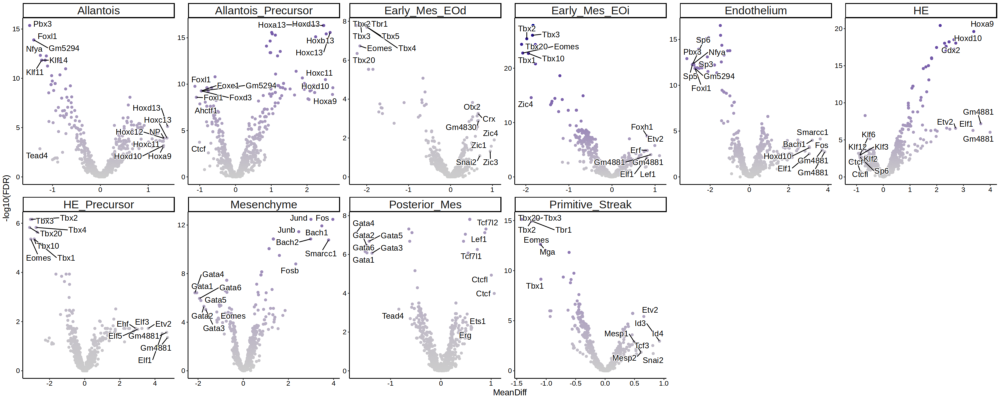

In [67]:
p = ggplot(ChromVAR.dt, aes(MeanDiff, -log10(FDR), label=motif)) +
            geom_point(aes(col = -log10(FDR))) +
            scale_color_gradient(low='gray80', high='darkblue', name = '-log10(FDR)') + 
            ggrepel::geom_text_repel(data=ChromVAR.dt[MeanDiff>0] %>% 
                                            .[,head(.SD, 7), by=celltype_v1],
                                aes(x=MeanDiff, y=-log10(FDR)), 
                                 max.overlaps=Inf, 
                                 box.padding = 0.4,
                                 bg.color='white', 
                                 bg.r = 0.1,
                                 size=5) +
            ggrepel::geom_text_repel(data=ChromVAR.dt[MeanDiff<0][order(MeanDiff)] %>% 
                                            .[,head(.SD, 7), by=celltype_v1],
                                aes(x=MeanDiff, y=-log10(FDR)), 
                                 max.overlaps=Inf, 
                                 box.padding = 0.4,
                                 bg.color='white', 
                                 bg.r = 0.1,
                                 size=5) +
    facet_wrap(~celltype_v1, scales='free', ncol=6) + 
    theme_classic() +
    theme(
       axis.text = element_text(color='black'),
      # axis.title = element_text(size=rel(1.0), color='black'),
        strip.text = element_text(size=20),
      text=element_text(size=15),
      legend.position="none"
    ) 
options(repr.plot.width=25, repr.plot.height=10)
p

Aggregate function missing, defaulting to 'length'



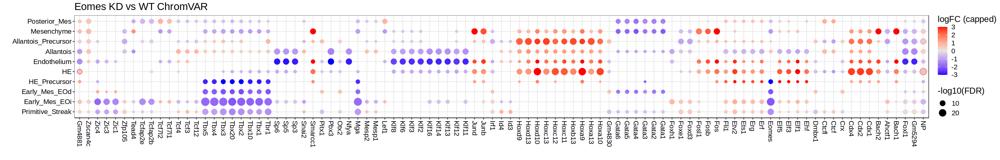

In [69]:
top_n = 10
cap = 3
motifs_keep = c(ChromVAR.dt[,head(.SD, top_n), by=celltype_v1][, motif], ChromVAR.dt[,tail(.SD, top_n), by=celltype_v1][, motif])

# Turn dt in matrix
DEGs.mtx = ChromVAR.dt[motif %in% motifs_keep ,c('motif',  'MeanDiff', 'celltype_v1')] %>% dcast(., celltype_v1 ~ motif, value.var = 'MeanDiff')
DEGs.mtx[is.na(DEGs.mtx)] = 0
DEGs.mtx = DEGs.mtx %>% as.data.frame() %>% tibble::column_to_rownames('celltype_v1')

# Cluster genes by logFC
order = hclust(dist(t(DEGs.mtx)))

# prepare data.table for plotting
to.plot = ChromVAR.dt[motif %in% motifs_keep & FDR < 0.05] %>%
    .[, gene := factor(motif, levels = order$labels[order$order])] %>%
    .[, celltype := factor(celltype_v1, levels = opts$celltype_levels)] %>% 
    .[, logFC_capped := ifelse(MeanDiff >= cap, cap, 
                               ifelse(MeanDiff <= -cap, -cap, MeanDiff))]

options(repr.plot.width=25, repr.plot.height=4)
ggplot(to.plot, aes(gene, celltype, size=-log10(FDR), col=logFC_capped)) + 
    geom_point() + 
    scale_color_gradient2(low='blue', mid = 'gray90', high='red', name='logFC (capped)') + 
    xlab('') + ylab('') +
    ggtitle('Eomes KD vs WT ChromVAR') + 
    theme_bw() + 
    theme(axis.text.x=element_text(angle=-90, hjust=0, vjust=0.5),
         axis.text=element_text(size=12, color='black'),
         text=element_text(size=15))

In [227]:
ChromVAR.dt = mclapply(keep, differential_chromvar, matrix = 'DeviationMatrix_JASPAR', mc.cores=12) %>% rbindlist()

In [53]:
fwrite(ChromVAR.dt, sprintf('%s/dChromVAR_JASPAR.txt.gz', args$outdir))

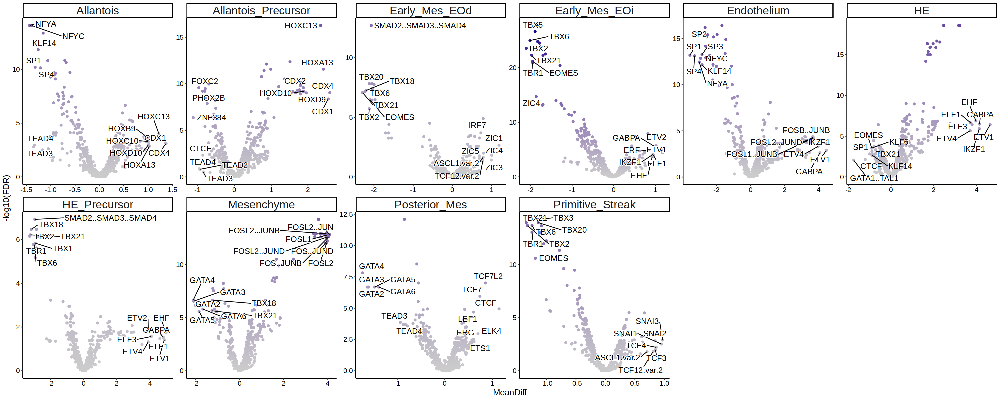

In [54]:
p = ggplot(ChromVAR.dt, aes(MeanDiff, -log10(FDR), label=motif)) +
            geom_point(aes(col = -log10(FDR))) +
            scale_color_gradient(low='gray80', high='darkblue', name = '-log10(FDR)') + 
            ggrepel::geom_text_repel(data=ChromVAR.dt[MeanDiff>0] %>% 
                                            .[,head(.SD, 7), by=celltype_v1],
                                aes(x=MeanDiff, y=-log10(FDR)), 
                                 max.overlaps=Inf, 
                                 box.padding = 0.4,
                                 bg.color='white', 
                                 bg.r = 0.1,
                                 size=5) +
            ggrepel::geom_text_repel(data=ChromVAR.dt[MeanDiff<0][order(MeanDiff)] %>% 
                                            .[,head(.SD, 7), by=celltype_v1],
                                aes(x=MeanDiff, y=-log10(FDR)), 
                                 max.overlaps=Inf, 
                                 box.padding = 0.4,
                                 bg.color='white', 
                                 bg.r = 0.1,
                                 size=5) +
    facet_wrap(~celltype_v1, scales='free', ncol=6) + 
    theme_classic() +
    theme(
       axis.text = element_text(color='black'),
      # axis.title = element_text(size=rel(1.0), color='black'),
        strip.text = element_text(size=20),
      text=element_text(size=15),
      legend.position="none"
    ) 
options(repr.plot.width=25, repr.plot.height=10)
p

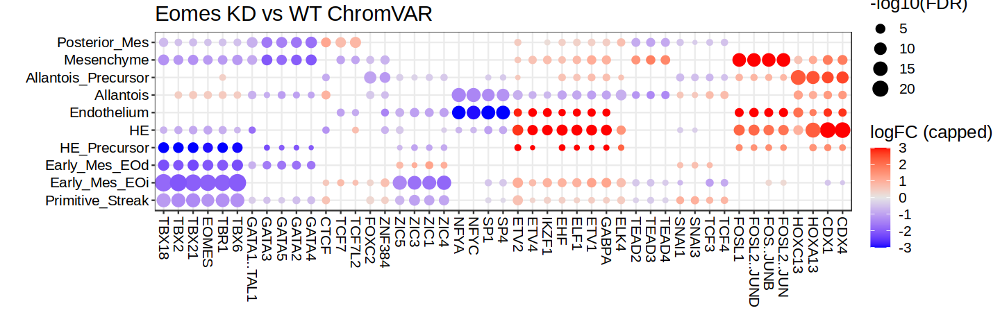

In [228]:
top_n = 4
cap = 3
motifs_keep = c(ChromVAR.dt[,head(.SD, top_n), by=celltype_v1][, motif], ChromVAR.dt[,tail(.SD, top_n), by=celltype_v1][, motif])

# Turn dt in matrix
DEGs.mtx = ChromVAR.dt[motif %in% motifs_keep ,c('motif',  'MeanDiff', 'celltype_v1')] %>% dcast(., celltype_v1 ~ motif, value.var = 'MeanDiff')
DEGs.mtx[is.na(DEGs.mtx)] = 0
DEGs.mtx = DEGs.mtx %>% as.data.frame() %>% tibble::column_to_rownames('celltype_v1')

# Cluster genes by logFC
order = hclust(dist(t(DEGs.mtx)))

# prepare data.table for plotting
to.plot = ChromVAR.dt[motif %in% motifs_keep & FDR < 0.05] %>%
    .[, gene := factor(motif, levels = order$labels[order$order])] %>%
    .[, celltype := factor(celltype_v1, levels = opts$celltype_levels)] %>% 
    .[, logFC_capped := ifelse(MeanDiff >= cap, cap, 
                               ifelse(MeanDiff <= -cap, -cap, MeanDiff))]

options(repr.plot.width=12, repr.plot.height=4)
ggplot(to.plot, aes(gene, celltype, size=-log10(FDR), col=logFC_capped)) + 
    geom_point() + 
    scale_color_gradient2(low='blue', mid = 'gray90', high='red', name='logFC (capped)') + 
    xlab('') + ylab('') +
    ggtitle('Eomes KD vs WT ChromVAR') + 
    theme_bw() + 
    theme(axis.text.x=element_text(angle=-90, hjust=0, vjust=0.5),
         axis.text=element_text(size=12, color='black'),
         text=element_text(size=15))

# Using In silico ChIP-seq

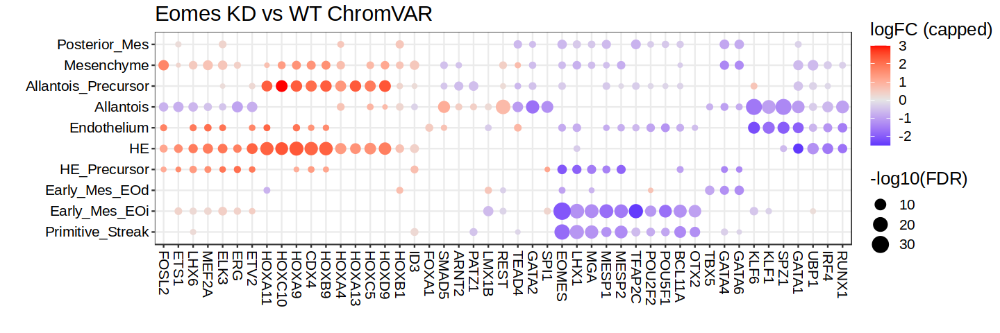

In [23]:
# CISBP
differential_chromvar = function(x, matrix = 'silicoChIP'){
        message(x)
        tmp = ArchRProject[meta[celltype_v1==x]$cell]
    tmp@cellColData$genotype = meta[celltype_v1==x]$genotype

        # Differential ChromVAR one v all
        diffMotif <- getMarkerFeatures(
            ArchRProj = tmp, 
            testMethod = 'wilcoxon',
            binarize = FALSE,
            useMatrix = matrix,
            groupBy = "genotype",
              useGroups = 'KO',
              bgdGroups = 'WT',
            useSeqnames="z",
            verbose = F
        )

        tmp2 = data.table(motif = str_split(rowData(diffMotif)$name, '_') %>% map_chr(1),
                                      FDR = assay(diffMotif[,1], 'FDR')[[1]],
                                      MeanDiff = assay(diffMotif[,1], 'MeanDiff')[[1]]) %>% 
                            .[order(-MeanDiff)] %>% 
                            .[,celltype_v1 := x]
    return(tmp2)
}  
keep = unique(opts$clusters2celltypes)[unique(opts$clusters2celltypes) != 'Blood_Progenitor']
ChromVAR.dt = mclapply(keep, differential_chromvar, matrix = 'silicoChIP_CISBPMatrix', mc.cores=12) %>% rbindlist()

top_n = 4
cap = 3
motifs_keep = c(ChromVAR.dt[,head(.SD, top_n), by=celltype_v1][, motif], ChromVAR.dt[,tail(.SD, top_n), by=celltype_v1][, motif])

# Turn dt in matrix
DEGs.mtx = ChromVAR.dt[motif %in% motifs_keep ,c('motif',  'MeanDiff', 'celltype_v1')] %>% dcast(., celltype_v1 ~ motif, value.var = 'MeanDiff')
DEGs.mtx[is.na(DEGs.mtx)] = 0
DEGs.mtx = DEGs.mtx %>% as.data.frame() %>% tibble::column_to_rownames('celltype_v1')

# Cluster genes by logFC
order = hclust(dist(t(DEGs.mtx)))

# prepare data.table for plotting
to.plot = ChromVAR.dt[motif %in% motifs_keep & FDR < 0.05] %>%
    .[, gene := factor(motif, levels = order$labels[order$order])] %>%
    .[, celltype := factor(celltype_v1, levels = opts$celltype_levels)] %>% 
    .[, logFC_capped := ifelse(MeanDiff >= cap, cap, 
                               ifelse(MeanDiff <= -cap, -cap, MeanDiff))]

options(repr.plot.width=12, repr.plot.height=4)
ggplot(to.plot, aes(gene, celltype, size=-log10(FDR), col=logFC_capped)) + 
    geom_point() + 
    scale_color_gradient2(low='blue', mid = 'gray90', high='red', name='logFC (capped)') + 
    xlab('') + ylab('') +
    ggtitle('Eomes KD vs WT ChromVAR') + 
    theme_bw() + 
    theme(axis.text.x=element_text(angle=-90, hjust=0, vjust=0.5),
         axis.text=element_text(size=12, color='black'),
         text=element_text(size=15))

In [24]:
fwrite(ChromVAR.dt, sprintf('%s/dChromVAR_CISBP_silico.txt.gz', args$outdir))

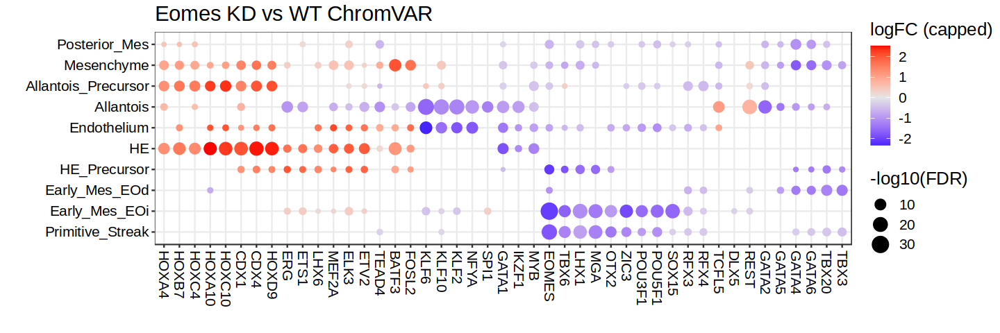

In [25]:
# JASPAR
differential_chromvar = function(x, matrix = 'silicoChIP'){
        message(x)
        tmp = ArchRProject[meta[celltype_v1==x]$cell]
    tmp@cellColData$genotype = meta[celltype_v1==x]$genotype

        # Differential ChromVAR one v all
        diffMotif <- getMarkerFeatures(
            ArchRProj = tmp, 
            testMethod = 'wilcoxon',
            binarize = FALSE,
            useMatrix = matrix,
            groupBy = "genotype",
              useGroups = 'KO',
              bgdGroups = 'WT',
            useSeqnames="z",
            verbose = F
        )

        tmp2 = data.table(motif = str_split(rowData(diffMotif)$name, '_') %>% map_chr(1),
                                      FDR = assay(diffMotif[,1], 'FDR')[[1]],
                                      MeanDiff = assay(diffMotif[,1], 'MeanDiff')[[1]]) %>% 
                            .[order(-MeanDiff)] %>% 
                            .[,celltype_v1 := x]
    return(tmp2)
}  
keep = unique(opts$clusters2celltypes)[unique(opts$clusters2celltypes) != 'Blood_Progenitor']
ChromVAR.dt = mclapply(keep, differential_chromvar, matrix = 'silicoChIP_JASPARMatrix', mc.cores=12) %>% rbindlist()

top_n = 4
cap = 3
motifs_keep = c(ChromVAR.dt[,head(.SD, top_n), by=celltype_v1][, motif], ChromVAR.dt[,tail(.SD, top_n), by=celltype_v1][, motif])

# Turn dt in matrix
DEGs.mtx = ChromVAR.dt[motif %in% motifs_keep ,c('motif',  'MeanDiff', 'celltype_v1')] %>% dcast(., celltype_v1 ~ motif, value.var = 'MeanDiff')
DEGs.mtx[is.na(DEGs.mtx)] = 0
DEGs.mtx = DEGs.mtx %>% as.data.frame() %>% tibble::column_to_rownames('celltype_v1')

# Cluster genes by logFC
order = hclust(dist(t(DEGs.mtx)))

# prepare data.table for plotting
to.plot = ChromVAR.dt[motif %in% motifs_keep & FDR < 0.05] %>%
    .[, gene := factor(motif, levels = order$labels[order$order])] %>%
    .[, celltype := factor(celltype_v1, levels = opts$celltype_levels)] %>% 
    .[, logFC_capped := ifelse(MeanDiff >= cap, cap, 
                               ifelse(MeanDiff <= -cap, -cap, MeanDiff))]

options(repr.plot.width=12, repr.plot.height=4)
ggplot(to.plot, aes(gene, celltype, size=-log10(FDR), col=logFC_capped)) + 
    geom_point() + 
    scale_color_gradient2(low='blue', mid = 'gray90', high='red', name='logFC (capped)') + 
    xlab('') + ylab('') +
    ggtitle('Eomes KD vs WT ChromVAR') + 
    theme_bw() + 
    theme(axis.text.x=element_text(angle=-90, hjust=0, vjust=0.5),
         axis.text=element_text(size=12, color='black'),
         text=element_text(size=15))

In [26]:
fwrite(ChromVAR.dt, sprintf('%s/dChromVAR_JASPAR_silico.txt.gz', args$outdir))

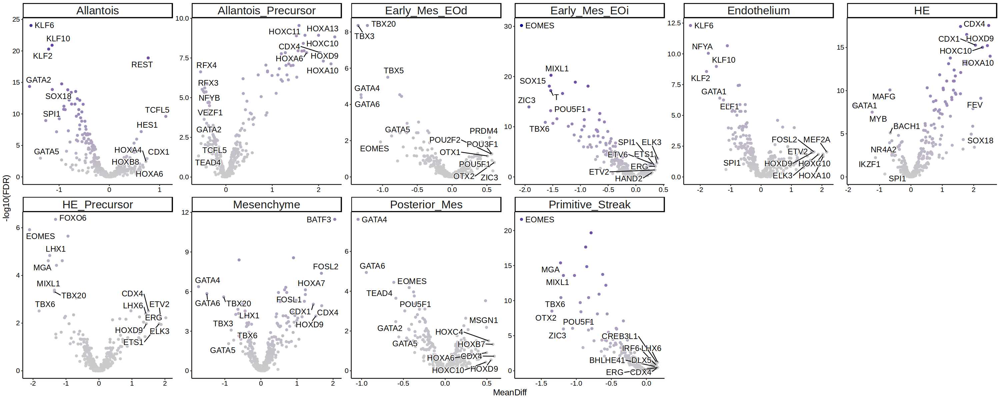

In [272]:
p = ggplot(ChromVAR.dt, aes(MeanDiff, -log10(FDR), label=motif)) +
            geom_point(aes(col = -log10(FDR))) +
            scale_color_gradient(low='gray80', high='darkblue', name = '-log10(FDR)') + 
            ggrepel::geom_text_repel(data=ChromVAR.dt[MeanDiff>0] %>% 
                                            .[,head(.SD, 7), by=celltype_v1],
                                aes(x=MeanDiff, y=-log10(FDR)), 
                                 max.overlaps=Inf, 
                                 box.padding = 0.4,
                                 bg.color='white', 
                                 bg.r = 0.1,
                                 size=5) +
            ggrepel::geom_text_repel(data=ChromVAR.dt[MeanDiff<0][order(MeanDiff)] %>% 
                                            .[,head(.SD, 7), by=celltype_v1],
                                aes(x=MeanDiff, y=-log10(FDR)), 
                                 max.overlaps=Inf, 
                                 box.padding = 0.4,
                                 bg.color='white', 
                                 bg.r = 0.1,
                                 size=5) +
    facet_wrap(~celltype_v1, scales='free', ncol=6) + 
    theme_classic() +
    theme(
       axis.text = element_text(color='black'),
      # axis.title = element_text(size=rel(1.0), color='black'),
        strip.text = element_text(size=20),
      text=element_text(size=15),
      legend.position="none"
    ) 
options(repr.plot.width=25, repr.plot.height=10)
p

In [63]:
# Quick comparison between chromVAR & chromVAR-multiome
dchromVAR = fread(sprintf('%s/dChromVAR_JASPAR.txt.gz', args$outdir))
dchromVAR_mo = fread(sprintf('%s/dChromVAR_JASPAR_silico.txt.gz', args$outdir))
motifs_keep = intersect(dchromVAR$motif, dchromVAR_mo$motif)
motifs_keep = motifs_keep[!motifs_keep %in% c('ZIC4', 'IRF7', 'HOXC13', 'PHOX2B')]
dchromVAR = dchromVAR[motif %in% motifs_keep]
dchromVAR_mo = dchromVAR_mo[motif %in% motifs_keep]

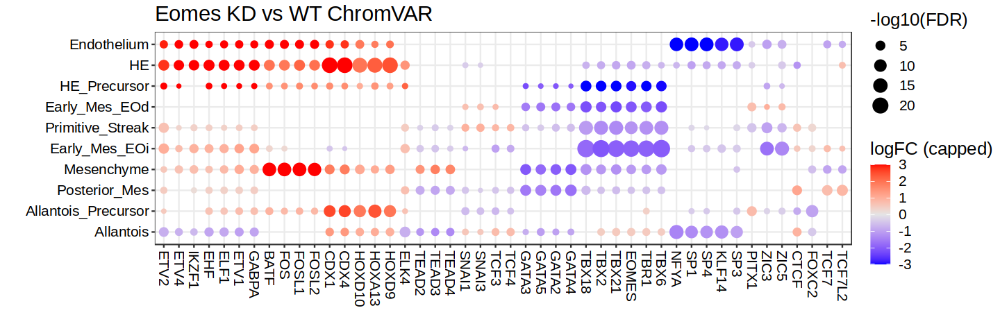

In [28]:
top_n = 4
cap = 3
motifs_keep = c(dchromVAR[,head(.SD, top_n), by=celltype_v1][, motif], dchromVAR[,tail(.SD, top_n), by=celltype_v1][, motif])

# Turn dt in matrix
DEGs.mtx = dchromVAR[motif %in% motifs_keep ,c('motif',  'MeanDiff', 'celltype_v1')] %>% dcast(., celltype_v1 ~ motif, value.var = 'MeanDiff')
DEGs.mtx[is.na(DEGs.mtx)] = 0
DEGs.mtx = DEGs.mtx %>% as.data.frame() %>% tibble::column_to_rownames('celltype_v1')

# Cluster genes by logFC
order = hclust(dist(t(DEGs.mtx)))

# prepare data.table for plotting
to.plot = dchromVAR[motif %in% motifs_keep & FDR < 0.05] %>%
    .[, gene := factor(motif, levels = order$labels[order$order])] %>%
    .[, celltype := factor(celltype_v1, levels = opts$celltype_levels2)] %>% 
    .[, logFC_capped := ifelse(MeanDiff >= cap, cap, 
                               ifelse(MeanDiff <= -cap, -cap, MeanDiff))]

options(repr.plot.width=12, repr.plot.height=4)
ggplot(to.plot, aes(gene, celltype, size=-log10(FDR), col=logFC_capped)) + 
    geom_point() + 
    scale_color_gradient2(low='blue', mid = 'gray90', high='red', name='logFC (capped)') + 
    xlab('') + ylab('') +
    ggtitle('Eomes KD vs WT ChromVAR') + 
    theme_bw() + 
    theme(axis.text.x=element_text(angle=-90, hjust=0, vjust=0.5),
         axis.text=element_text(size=12, color='black'),
         text=element_text(size=15))

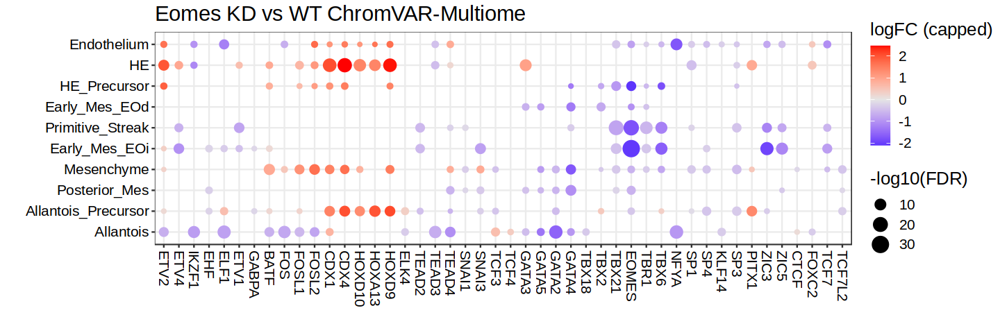

In [29]:
# prepare data.table for plotting
to.plot = dchromVAR_mo[motif %in% motifs_keep & FDR < 0.05] %>%
    .[, gene := factor(motif, levels = order$labels[order$order])] %>%
    .[, celltype := factor(celltype_v1, levels = opts$celltype_levels2)] %>% 
    .[, logFC_capped := ifelse(MeanDiff >= cap, cap, 
                               ifelse(MeanDiff <= -cap, -cap, MeanDiff))]

options(repr.plot.width=12, repr.plot.height=4)
ggplot(to.plot, aes(gene, celltype, size=-log10(FDR), col=logFC_capped)) + 
    geom_point() + 
    scale_color_gradient2(low='blue', mid = 'gray90', high='red', name='logFC (capped)') + 
    xlab('') + ylab('') +
    ggtitle('Eomes KD vs WT ChromVAR-Multiome') + 
    theme_bw() + 
    theme(axis.text.x=element_text(angle=-90, hjust=0, vjust=0.5),
         axis.text=element_text(size=12, color='black'),
         text=element_text(size=15))

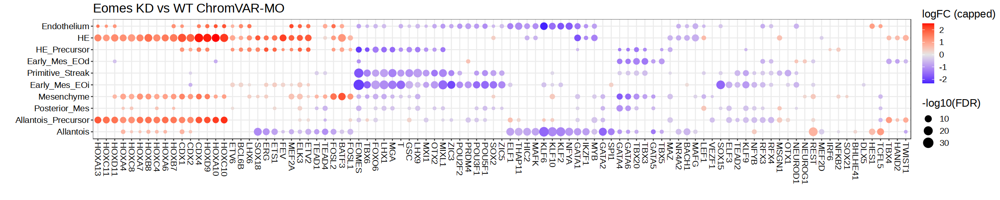

In [66]:
dchromVAR_mo = fread(sprintf('%s/dChromVAR_JASPAR_silico.txt.gz', args$outdir))

top_n = 10
cap = 3
#motifs_keep = c('CDX4', 'EOMES', 'ZIC3', 'SOX15', 'GATA1', 'GATA2', 'TBX20', 'ETV2', 'LHX1')
motifs_keep = c(dchromVAR_mo[,head(.SD, top_n), by=celltype_v1][, motif], dchromVAR_mo[,tail(.SD, top_n), by=celltype_v1][, motif])

# Turn dt in matrix
DEGs.mtx = dchromVAR_mo[motif %in% motifs_keep ,c('motif',  'MeanDiff', 'celltype_v1')] %>% dcast(., celltype_v1 ~ motif, value.var = 'MeanDiff')
DEGs.mtx[is.na(DEGs.mtx)] = 0
DEGs.mtx = DEGs.mtx %>% as.data.frame() %>% tibble::column_to_rownames('celltype_v1')

# Cluster genes by logFC
order = hclust(dist(t(DEGs.mtx)))

# prepare data.table for plotting
to.plot = dchromVAR_mo[motif %in% motifs_keep & FDR < 0.05] %>%
    .[, gene := factor(motif, levels = order$labels[order$order])] %>%
    .[, celltype := factor(celltype_v1, levels = opts$celltype_levels2)] %>% 
    .[, logFC_capped := ifelse(MeanDiff >= cap, cap, 
                               ifelse(MeanDiff <= -cap, -cap, MeanDiff))]

options(repr.plot.width=20, repr.plot.height=4)
ggplot(to.plot, aes(gene, celltype, size=-log10(FDR), col=logFC_capped)) + 
    geom_point() + 
    scale_color_gradient2(low='blue', mid = 'gray90', high='red', name='logFC (capped)') + 
    xlab('') + ylab('') +
    ggtitle('Eomes KD vs WT ChromVAR-MO') + 
    theme_bw() + 
    theme(axis.text.x=element_text(angle=-90, hjust=0, vjust=0.5),
         axis.text=element_text(size=12, color='black'),
         text=element_text(size=15))

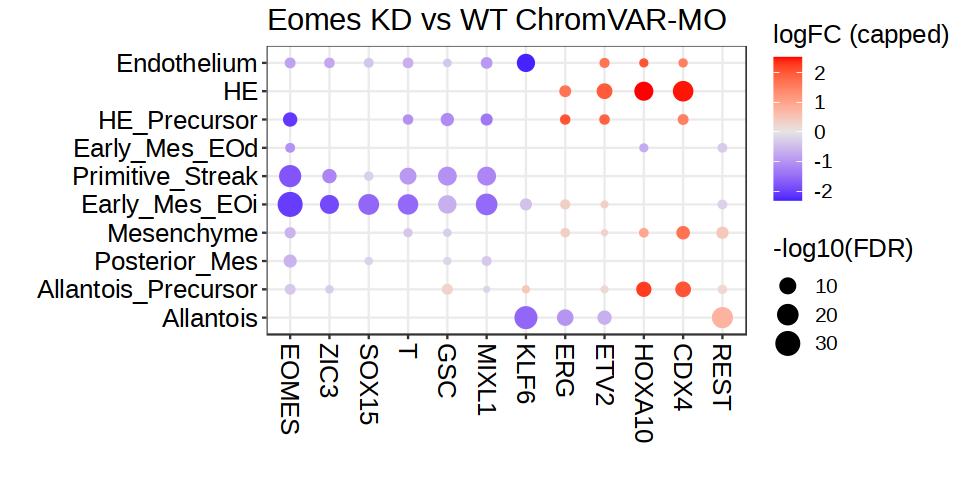

In [70]:
dchromVAR_mo = fread(sprintf('%s/dChromVAR_JASPAR_silico.txt.gz', args$outdir))

motifs_keep = c('EOMES', 'ZIC3', 'SOX15', 'T', 'GSC', 'MIXL1', 'KLF6', 
                'ERG','ETV2', 'HOXA10', 'CDX4', 
                'REST')

# prepare data.table for plotting
to.plot = dchromVAR_mo[motif %in% motifs_keep & FDR < 0.05] %>%
    .[, gene := factor(motif, levels = motifs_keep)] %>%
    .[, celltype := factor(celltype_v1, levels = opts$celltype_levels2)] %>% 
    .[, logFC_capped := ifelse(MeanDiff >= cap, cap, 
                               ifelse(MeanDiff <= -cap, -cap, MeanDiff))]

options(repr.plot.width=8, repr.plot.height=4)
ggplot(to.plot, aes(gene, celltype, size=-log10(FDR), col=logFC_capped)) + 
    geom_point() + 
    scale_color_gradient2(low='blue', mid = 'gray90', high='red', name='logFC (capped)') + 
    xlab('') + ylab('') +
    ggtitle('Eomes KD vs WT ChromVAR-MO') + 
    theme_bw() + 
    theme(axis.text.x=element_text(angle=-90, hjust=0, vjust=0.5),
         axis.text=element_text(size=15, color='black'),
         text=element_text(size=15))

#### Motif Enrichment

In [13]:
args$groupA = 'KO'
args$groupB = 'WT'
args$celltypes = unique(opts$clusters2celltypes)[unique(opts$clusters2celltypes) != 'Blood_Progenitor']
opts$groups = c(args$groupA, args$groupB)

keep = args$celltypes 

In [7]:
# Get PeakMatrix to calculate statistics
atac.sce = getMatrixFromProject(
  ArchRProj = ArchRProject,
  useMatrix = "PeakMatrix")

ArchR logging to : ArchRLogs/ArchR-getMatrixFromProject-1271816797da47-Date-2023-05-26_Time-18-53-53.log
If there is an issue, please report to github with logFile!

2023-05-26 18:55:02 : Organizing colData, 1.158 mins elapsed.

2023-05-26 18:55:03 : Organizing rowData, 1.168 mins elapsed.

2023-05-26 18:55:03 : Organizing rowRanges, 1.168 mins elapsed.

2023-05-26 18:55:03 : Organizing Assays (1 of 1), 1.169 mins elapsed.

2023-05-26 18:55:47 : Constructing SummarizedExperiment, 1.898 mins elapsed.

2023-05-26 18:56:24 : Finished Matrix Creation, 2.52 mins elapsed.



In [8]:
# Fix order
atac.sce = atac.sce[,match(meta$cell, colnames(atac.sce))]
summary(colnames(atac.sce) == meta$cell)


   Mode    TRUE 
logical   27135 

In [9]:
# Get peakset
peakSet = as.data.table(ArchRProject@peakSet) %>% 
    .[, feature:=paste0(seqnames, ':', start, '-', end)] %>%
    .[,idx:=1:nrow(.)] %>%
    .[,c('feature', 'idx')]
features = peakSet$feature

In [21]:
# fix other things
rownames(atac.sce) = features
atac.sce$celltype_v1 = meta$celltype_v1
atac.sce$genotype = meta$genotype
atac.sce@assays@data$counts = atac.sce@assays@data$PeakMatrix

atac.mtx = atac.sce

In [108]:
min.cdr=0.3

DARs = mclapply(keep, function(ct, min.cdr=0.15){ #args$celltypes
        ##################################
        ## calculate feature statistics ##
        ##################################
        # using original single-cell data to determine detection rate
        atac.mtx_tmp <- atac.mtx[,atac.mtx$celltype_v1 %in% ct]
        stopifnot(opts$groups%in%atac.mtx_tmp$genotype)
        atac.mtx_tmp$genotype <- factor(atac.mtx_tmp$genotype, levels=opts$groups)
        
        acc.dt <- data.table(
          feature = rownames(atac.mtx_tmp),
          detection_rate_groupA = rowMeans(assay(atac.mtx_tmp,"counts")[,colData(atac.mtx_tmp)$genotype==opts$groups[1]]>0) %>% round(2),
          detection_rate_groupB = rowMeans(assay(atac.mtx_tmp,"counts")[,colData(atac.mtx_tmp)$genotype==opts$groups[2]]>0) %>% round(2)
        )
        
        # Consider only features that have a minimum detection rate
        features.to.use <- acc.dt[detection_rate_groupA>=min.cdr | detection_rate_groupB>=min.cdr,feature]
        message(ct, ' with ', length(features.to.use), ' regions')

        #ArchRProject.filt = ArchRProject[ArchRProject@cellColData$celltype==ct,]
        ##########################
        ## Differential testing ##
        ##########################
        # Subset to celltype & add genotype information
        tmp = ArchRProject[meta[celltype_v1==ct]$cell]
        tmp$genotype = meta[celltype_v1==ct]$genotype
        # Differential ChromVAR one v all
        out <- getMarkerFeatures(
            ArchRProj = tmp, 
            testMethod = "wilcoxon",
            binarize = FALSE,
            useMatrix = 'PeakMatrix',
            groupBy = "genotype",
              useGroups = 'KO',
              bgdGroups = 'WT',
            verbose = F
        )
        
        # If peak not in features.to.use, set log2FC to 0 and FDR to 1
        rownames(out) = features
        assay(out, 'Log2FC')[!rownames(out) %in% features.to.use,] = 0
        assay(out, 'FDR')[!rownames(out) %in% features.to.use,] = 1
        colnames(out) = ct
        return(out)
}, mc.cores=12)

# Combine DARs of all celltypes
DARs = do.call('cbind', DARs)
colnames(DARs) = keep

ArchR logging to : ArchRLogs/ArchR-plotEnrichHeatmap-12718163f40ebd-Date-2023-05-26_Time-19-18-33.log
If there is an issue, please report to github with logFile!



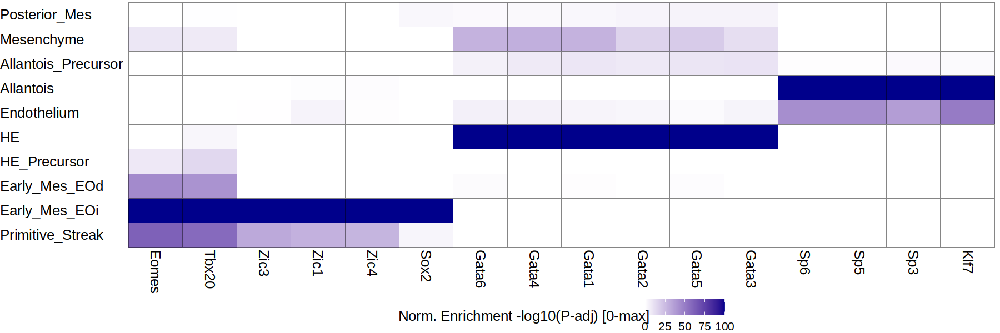

In [62]:
enrichMotifs <- suppressMessages(peakAnnoEnrichment(
    seMarker = DARs,
    ArchRProj = ArchRProject,
    peakAnnotation = "Motif_cisbp",
    cutOff = "FDR <= 0.2 & Log2FC <= -0.5"
  ))

options(repr.plot.width=15, repr.plot.height=5)
plot_enr_heatmap(enrichMotifs, ntop = 50)

ArchR logging to : ArchRLogs/ArchR-plotEnrichHeatmap-127181c106917-Date-2023-05-26_Time-19-18-42.log
If there is an issue, please report to github with logFile!



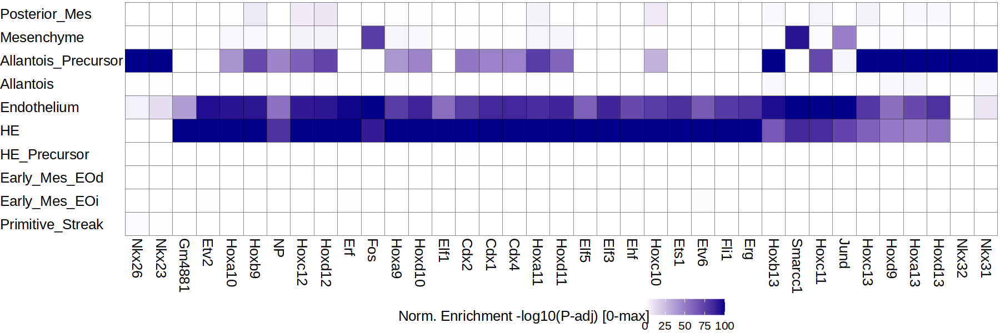

In [63]:
enrichMotifs <- suppressMessages(peakAnnoEnrichment(
    seMarker = DARs,
    ArchRProj = ArchRProject,
    peakAnnotation = "Motif_cisbp",
    cutOff = "FDR <= 0.2 & Log2FC >=0.5"
  ))

options(repr.plot.width=15, repr.plot.height=5)
plot_enr_heatmap(enrichMotifs, ntop = 50)

In [109]:
DARs.dt = lapply(colnames(DARs), function(x){
    tmp = data.table(peak = rownames(DARs),
                                  FDR = assay(DARs[,x], 'FDR')[[1]],
                                  Log2FC  = assay(DARs[,x], 'Log2FC')[[1]]) %>% 
                        .[order(-Log2FC)] %>% 
                        .[,celltype_v1 := x]
    return(tmp)
}) %>% rbindlist()

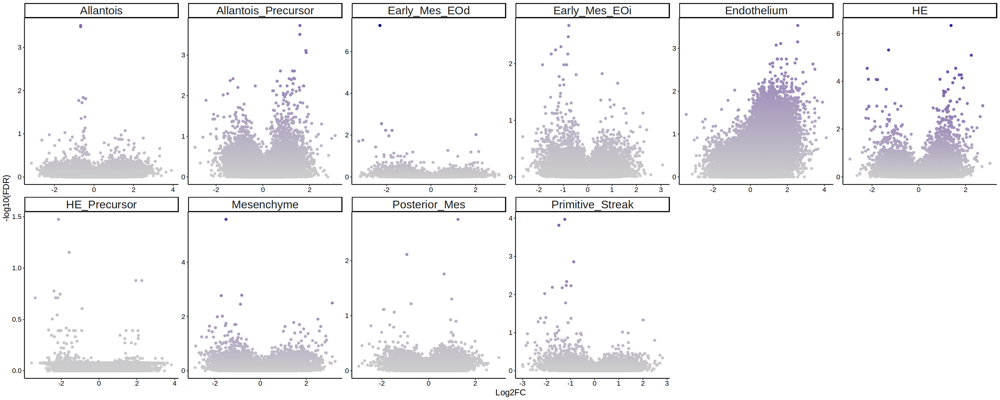

In [110]:
p = ggplot(DARs.dt[Log2FC!=0], aes(Log2FC, -log10(FDR))) +
            geom_point(aes(col = -log10(FDR))) +
            scale_color_gradient(low='gray80', high='darkblue', name = '-log10(FDR)') + 
    facet_wrap(~celltype_v1, scales='free', ncol=6) + 
    theme_classic() +
    theme(
       axis.text = element_text(color='black'),
      # axis.title = element_text(size=rel(1.0), color='black'),
        strip.text = element_text(size=20),
      text=element_text(size=15),
      legend.position="none"
    ) 
options(repr.plot.width=25, repr.plot.height=10)
p

In [111]:
ArchRProject@peakAnnotation$silicoChIP_JASPAR = list(Name = 'silicoChIP_JASPAR',
                                            motifs = NA,
                                            Positions = "/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/processed/atac/archR/Annotations/silicoChIP_JASPAR-Positions-In-Peaks.rds",
                                             Matches = "/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/processed/atac/archR/Annotations/silicoChIP_JASPAR-Matches-In-Peaks.rds")

ArchR logging to : ArchRLogs/ArchR-plotEnrichHeatmap-127181528c7b65-Date-2023-05-26_Time-20-10-24.log
If there is an issue, please report to github with logFile!



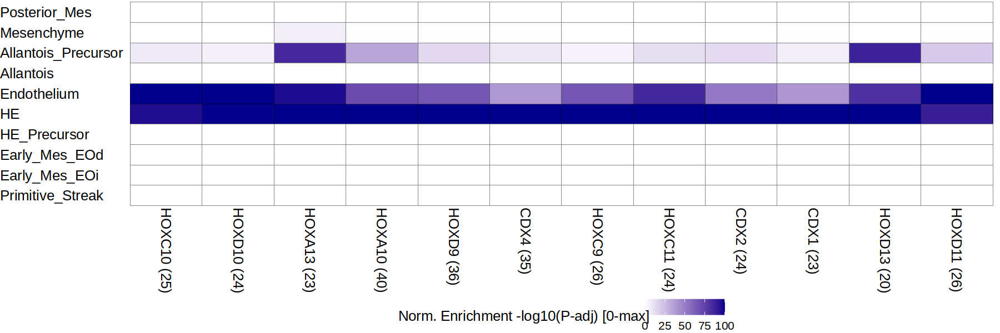

In [113]:
enrichMotifs <- suppressMessages(peakAnnoEnrichment(
    seMarker = DARs,
    ArchRProj = ArchRProject,
    peakAnnotation = "silicoChIP_JASPAR",
    cutOff = "FDR <= 0.1 & Log2FC >=0.5"
  ))

options(repr.plot.width=15, repr.plot.height=5)
plot_enr_heatmap(enrichMotifs, ntop = 1000)

In [114]:
enrichMotifs <- suppressMessages(peakAnnoEnrichment(
    seMarker = DARs,
    ArchRProj = ArchRProject,
    peakAnnotation = "silicoChIP_JASPAR",
    cutOff = "FDR <= 0.1 & Log2FC <= -0.5"
  ))

options(repr.plot.width=15, repr.plot.height=5)
plot_enr_heatmap(enrichMotifs, ntop = 50)

ArchR logging to : ArchRLogs/ArchR-plotEnrichHeatmap-12718146bbc215-Date-2023-05-26_Time-20-10-27.log
If there is an issue, please report to github with logFile!



ERROR: Error in plotEnrichHeatmap(enrichMotifs, n = ntop, returnMatrix = TRUE): No enrichments found for your cutoff!


In [ ]:
ArchRProject@peakAnnotation$silicoChIP_CISBP = list(Name = 'silicoChIP_CISBP',
                                            motifs = NA,
                                            Positions = "/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/processed/atac/archR/Annotations/silicoChIP_CISBP-Positions-In-Peaks.rds",
                                             Matches = "/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/processed/atac/archR/Annotations/silicoChIP_CISBP-Matches-In-Peaks.rds")

In [ ]:
enrichMotifs <- suppressMessages(peakAnnoEnrichment(
    seMarker = DARs,
    ArchRProj = ArchRProject,
    peakAnnotation = "silicoChIP_CISBP",
    cutOff = "FDR <= 0.05 & Log2FC >=0.5"
  ))

options(repr.plot.width=15, repr.plot.height=5)
plot_enr_heatmap(enrichMotifs, ntop = 1000)

ArchR logging to : ArchRLogs/ArchR-plotEnrichHeatmap-1271815152132b-Date-2023-05-26_Time-20-06-29.log
If there is an issue, please report to github with logFile!



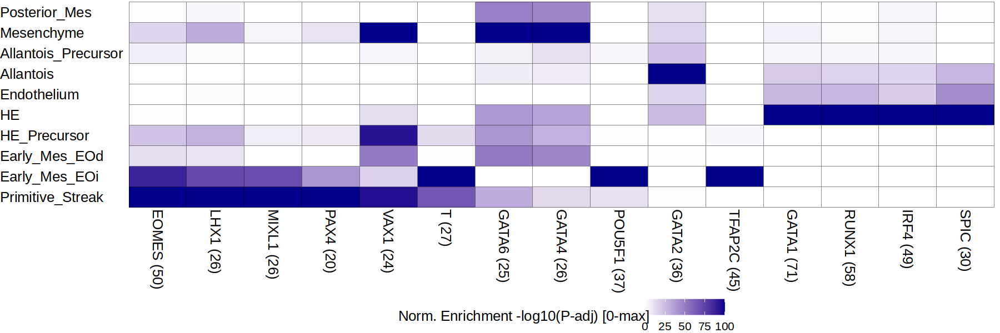

In [106]:
enrichMotifs <- suppressMessages(peakAnnoEnrichment(
    seMarker = DARs,
    ArchRProj = ArchRProject,
    peakAnnotation = "silicoChIP_CISBP",
    cutOff = "FDR <= 0.05 & Log2FC <= -0.5"
  ))

options(repr.plot.width=15, repr.plot.height=5)
plot_enr_heatmap(enrichMotifs, ntop = 50)

In [68]:
min.cdr=0.3

DARs = mclapply(keep, function(ct, min.cdr=0.0){ #args$celltypes
        ##################################
        ## calculate feature statistics ##
        ##################################
        # using original single-cell data to determine detection rate
        atac.mtx_tmp <- atac.mtx[,atac.mtx$celltype_v1 %in% ct]
        stopifnot(opts$groups%in%atac.mtx_tmp$genotype)
        atac.mtx_tmp$genotype <- factor(atac.mtx_tmp$genotype, levels=opts$groups)
        
        acc.dt <- data.table(
          feature = rownames(atac.mtx_tmp),
          detection_rate_groupA = rowMeans(assay(atac.mtx_tmp,"counts")[,colData(atac.mtx_tmp)$genotype==opts$groups[1]]>0) %>% round(2),
          detection_rate_groupB = rowMeans(assay(atac.mtx_tmp,"counts")[,colData(atac.mtx_tmp)$genotype==opts$groups[2]]>0) %>% round(2)
        )
        
        # Consider only features that have a minimum detection rate
        features.to.use <- acc.dt[detection_rate_groupA>=min.cdr | detection_rate_groupB>=min.cdr,feature]
        message(ct, ' with ', length(features.to.use), ' regions')

        #ArchRProject.filt = ArchRProject[ArchRProject@cellColData$celltype==ct,]
        ##########################
        ## Differential testing ##
        ##########################
        # Subset to celltype & add genotype information
        tmp = ArchRProject[meta[celltype_v1==ct]$cell]
        tmp$genotype = meta[celltype_v1==ct]$genotype
        # Differential ChromVAR one v all
        out <- getMarkerFeatures(
            ArchRProj = tmp, 
            testMethod = "binomial",
            binarize = TRUE,
            useMatrix = 'PeakMatrix',
            groupBy = "genotype",
              useGroups = 'KO',
              bgdGroups = 'WT',
            verbose = F
        )
        
        # If peak not in features.to.use, set log2FC to 0 and FDR to 1
        rownames(out) = features
        assay(out, 'Log2FC')[!rownames(out) %in% features.to.use,] = 0
        assay(out, 'FDR')[!rownames(out) %in% features.to.use,] = 1
        colnames(out) = ct
        return(out)
}, mc.cores=12)

# Combine DARs of all celltypes
DARs = do.call('cbind', DARs)
colnames(DARs) = keep

ArchR logging to : ArchRLogs/ArchR-plotEnrichHeatmap-1271811b4fa379-Date-2023-05-26_Time-19-40-51.log
If there is an issue, please report to github with logFile!



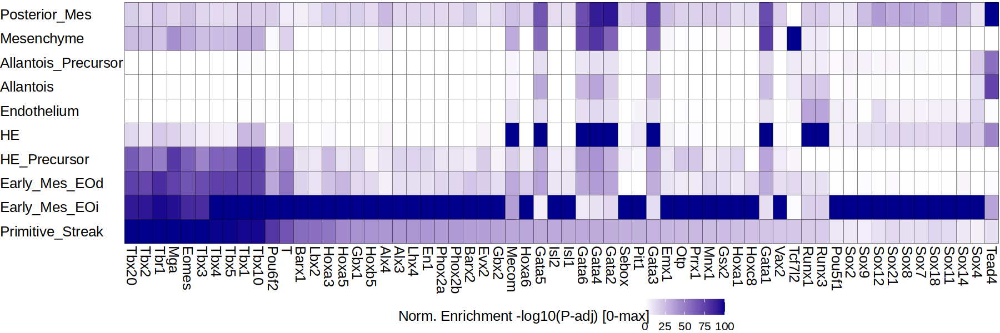

In [73]:
enrichMotifs <- suppressMessages(peakAnnoEnrichment(
    seMarker = DARs,
    ArchRProj = ArchRProject,
    peakAnnotation = "Motif_cisbp",
    cutOff = "FDR <= 0.1 & Log2FC <= -0.5"
  ))

options(repr.plot.width=15, repr.plot.height=5)
plot_enr_heatmap(enrichMotifs, ntop = 50)

ArchR logging to : ArchRLogs/ArchR-plotEnrichHeatmap-1271812f865f05-Date-2023-05-26_Time-19-41-00.log
If there is an issue, please report to github with logFile!



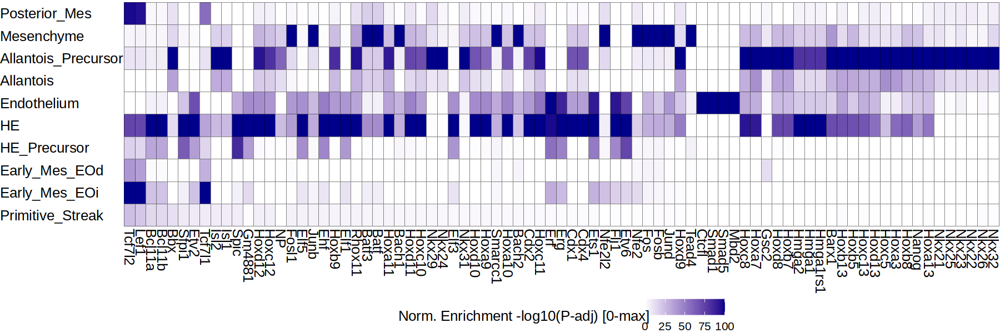

In [74]:
enrichMotifs <- suppressMessages(peakAnnoEnrichment(
    seMarker = DARs,
    ArchRProj = ArchRProject,
    peakAnnotation = "Motif_cisbp",
    cutOff = "FDR <= 0.1 & Log2FC >=0.5"
  ))

options(repr.plot.width=15, repr.plot.height=5)
plot_enr_heatmap(enrichMotifs, ntop = 50)

In [75]:
getAvailableMatrices(ArchRProject)

[1] "DeviationMatrix_CISBP"  "DeviationMatrix_JASPAR" "GeneScoreMatrix_TSS"   
[4] "GeneScoreMatrix_distal" "MarkerPeaksMatrix"      "PeakMatrix"            
[7] "PeakMatrix_atlas"       "TileMatrix"             "silicoChIPMatrix"

In [71]:
DARs.dt = lapply(colnames(DARs), function(x){
    tmp = data.table(peak = rownames(DARs),
                                  FDR = assay(DARs[,x], 'FDR')[[1]],
                                  Log2FC  = assay(DARs[,x], 'Log2FC')[[1]]) %>% 
                        .[order(-Log2FC)] %>% 
                        .[,celltype_v1 := x]
    return(tmp)
}) %>% rbindlist()

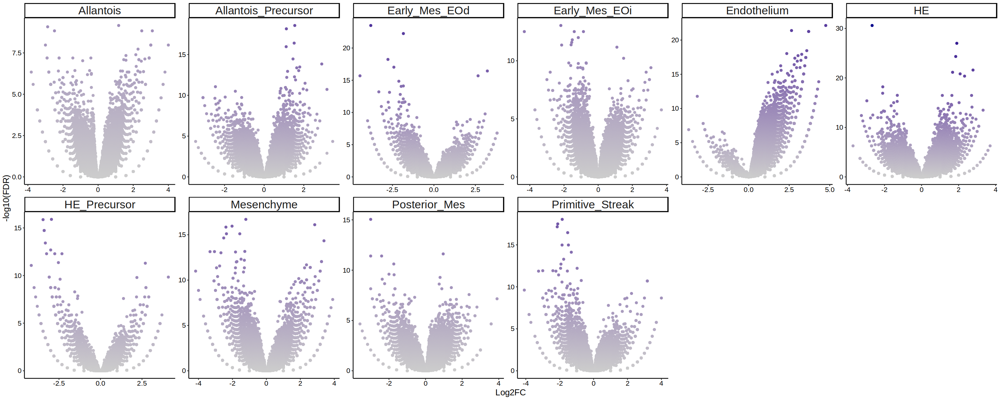

In [72]:
p = ggplot(DARs.dt[Log2FC!=0], aes(Log2FC, -log10(FDR))) +
            geom_point(aes(col = -log10(FDR))) +
            scale_color_gradient(low='gray80', high='darkblue', name = '-log10(FDR)') + 
    facet_wrap(~celltype_v1, scales='free', ncol=6) + 
    theme_classic() +
    theme(
       axis.text = element_text(color='black'),
      # axis.title = element_text(size=rel(1.0), color='black'),
        strip.text = element_text(size=20),
      text=element_text(size=15),
      legend.position="none"
    ) 
options(repr.plot.width=25, repr.plot.height=10)
p

In [79]:
ArchRProject@peakAnnotation$Motif_JASPAR2020

$Name
[1] "Motif_JASPAR2020"

$motifs
PWMatrixList of length 633
names(633): FOXF2_1 FOXD1_2 IRF2_3 MZF1.var.2_4 ... YY2_631 ZNF263_632 CREM_633

$Positions
[1] "/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/processed/atac/archR/Annotations/Motif_JASPAR2020-Positions-In-Peaks.rds"

$Matches
[1] "/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/processed/atac/archR/Annotations/Motif_JASPAR2020-Matches-In-Peaks.rds"


In [98]:
ArchRProject@peakAnnotation$silicoChIP = list(Name = 'silicoChIP',
                                            motifs = NA,
                                            Positions = "/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/processed/atac/archR/Annotations/silicoChIP_JASPAR-Positions-In-Peaks.rds",
                                             Matches = "/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/processed/atac/archR/Annotations/silicoChIP_JASPAR-Matches-In-Peaks.rds")

ArchR logging to : ArchRLogs/ArchR-plotEnrichHeatmap-1271815951855d-Date-2023-05-26_Time-20-01-00.log
If there is an issue, please report to github with logFile!



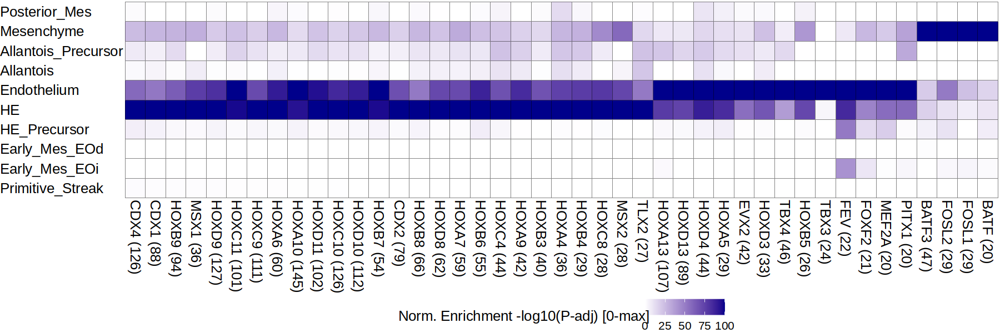

In [99]:
enrichMotifs <- suppressMessages(peakAnnoEnrichment(
    seMarker = DARs,
    ArchRProj = ArchRProject,
    peakAnnotation = "silicoChIP",
    cutOff = "FDR <= 0.1 & Log2FC >=0.5"
  ))

options(repr.plot.width=15, repr.plot.height=5)
plot_enr_heatmap(enrichMotifs, ntop = 1000)

ArchR logging to : ArchRLogs/ArchR-plotEnrichHeatmap-12718157b8067d-Date-2023-05-26_Time-19-59-56.log
If there is an issue, please report to github with logFile!



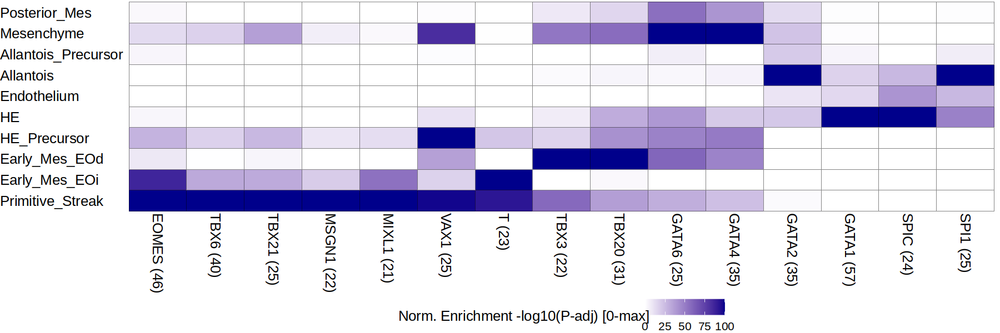

In [95]:
enrichMotifs <- suppressMessages(peakAnnoEnrichment(
    seMarker = DARs,
    ArchRProj = ArchRProject,
    peakAnnotation = "silicoChIP",
    cutOff = "FDR <= 0.1 & Log2FC <= -0.5"
  ))

options(repr.plot.width=15, repr.plot.height=5)
plot_enr_heatmap(enrichMotifs, ntop = 50)

In [101]:
ArchRProject@peakAnnotation$silicoChIP_CISBP = list(Name = 'silicoChIP_CISBP',
                                            motifs = NA,
                                            Positions = "/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/processed/atac/archR/Annotations/silicoChIP_CISBP-Positions-In-Peaks.rds",
                                             Matches = "/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/processed/atac/archR/Annotations/silicoChIP_CISBP-Matches-In-Peaks.rds")

ArchR logging to : ArchRLogs/ArchR-plotEnrichHeatmap-1271815146db1f-Date-2023-05-26_Time-20-06-49.log
If there is an issue, please report to github with logFile!



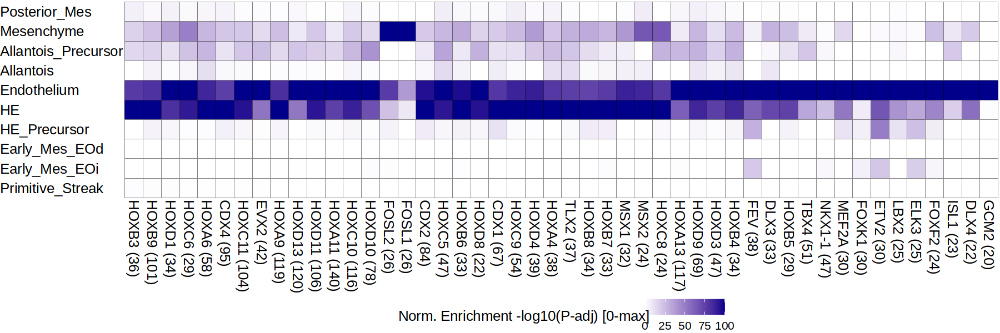

In [107]:
enrichMotifs <- suppressMessages(peakAnnoEnrichment(
    seMarker = DARs,
    ArchRProj = ArchRProject,
    peakAnnotation = "silicoChIP_CISBP",
    cutOff = "FDR <= 0.05 & Log2FC >=0.5"
  ))

options(repr.plot.width=15, repr.plot.height=5)
plot_enr_heatmap(enrichMotifs, ntop = 1000)

ArchR logging to : ArchRLogs/ArchR-plotEnrichHeatmap-1271815152132b-Date-2023-05-26_Time-20-06-29.log
If there is an issue, please report to github with logFile!



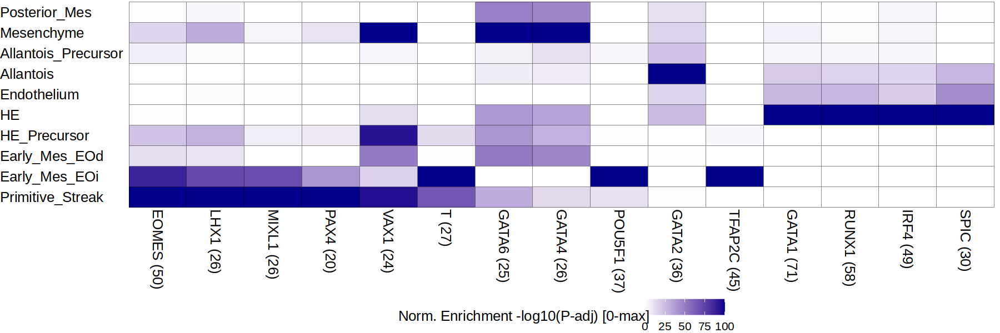

In [106]:
enrichMotifs <- suppressMessages(peakAnnoEnrichment(
    seMarker = DARs,
    ArchRProj = ArchRProject,
    peakAnnotation = "silicoChIP_CISBP",
    cutOff = "FDR <= 0.05 & Log2FC <= -0.5"
  ))

options(repr.plot.width=15, repr.plot.height=5)
plot_enr_heatmap(enrichMotifs, ntop = 50)

#### EdgeR

In [10]:
volcano_plot = function(dt, ntop=5, logFC_thr = args$logFC_thr, FDR_thr = args$FDR_thr, title=NULL){
    tmp = dt[,sign:=ifelse(padj_fdr < FDR_thr & abs(logFC) > logFC_thr, ifelse(logFC>0, 'pos', 'neg'), 'nonsig')] %>%
        .[order(-abs(logFC))]
    labels = tmp[, head(.SD, ntop),  by=sign][sign!='nonsig']
    
    p = ggplot(tmp, aes(logFC, -log10(padj_fdr), col=sign)) + 
        geom_point() + 
        scale_colour_manual(values=c('pos' = 'red', 'neg' = 'blue', 'nonsig' = 'black')) + 
        geom_vline(xintercept=c(-logFC_thr, logFC_thr),  linetype = "longdash") +
        geom_vline(xintercept=0, color='orange', linetype = "longdash") +
        geom_hline(yintercept=-log10(FDR_thr),  linetype = "longdash") + 
        ggrepel::geom_text_repel(data=labels, aes(label=peak), 
                                 color='black',
                                 size=5,
                                 box.padding = 0.5, 
                                 max.overlaps = Inf,
                                 bg.color='white', 
                                 bg.r = 0.1) + 
        xlim(c(-max(abs(tmp$logFC)), max(abs(tmp$logFC)))) + 
        ggtitle(title) + 
        theme_bw() + 
        theme(text = element_text(size=15, color='black'),
             axis.text = element_text(size=15, color='black'),
             legend.position = 'none',
              plot.title = element_text(hjust=0.5))
    
    return(p)
}

In [11]:
cell_metadata.dt = meta[day != 'D3']
cell_metadata.dt = cell_metadata.dt[,group:=paste0(celltype_v1, '.', genotype)]

args$min_cells = 25
args$fraction_cells_per_replicate = 0.4
args$nrep = 5
args$min_CDR = 0.35

# Define groups
opts$groups <- c(args$groupA,args$groupB)

In [12]:
table(cell_metadata.dt$group)


Allantois_Precursor.KO Allantois_Precursor.WT           Allantois.KO 
                  1389                    399                   1446 
          Allantois.WT    Blood_Progenitor.KO    Blood_Progenitor.WT 
                   429                      1                    244 
      Early_Mes_EOd.KO       Early_Mes_EOd.WT       Early_Mes_EOi.KO 
                   260                   5485                   3784 
      Early_Mes_EOi.WT         Endothelium.KO         Endothelium.WT 
                  1990                    431                    206 
       HE_Precursor.KO        HE_Precursor.WT                  HE.KO 
                   103                   1291                    377 
                 HE.WT          Mesenchyme.KO          Mesenchyme.WT 
                  1738                    317                   1676 
      Posterior_Mes.KO       Posterior_Mes.WT    Primitive_Streak.KO 
                  2908                    596                    840 
   Primitive_Streak

In [13]:
##################################
## Create pseudobulk replicates ##
##################################

cell2replicate.dt <- lapply(unique(cell_metadata.dt$group), function(i){
  # Select group
  tmp <- cell_metadata.dt[group==i]
  # continue only if enough cells
  if ((args$fraction_cells_per_replicate*nrow(tmp))>=args$min_cells) {
      # determine nr cells per replicate
      ncells_per_replicate <- round(args$fraction_cells_per_replicate*nrow(tmp))
      # randomly sample cells
      seq(1,args$nrep) %>% map(function(j) {
        tmp[sample.int(nrow(tmp),ncells_per_replicate, replace=F)] %>% 
          .[,replicate:=sprintf("%s_rep%s",i,j)] %>%
          .[,c("cell","group","replicate")] %>% 
          return
  }) %>% rbindlist %>% return
}}) %>% rbindlist

stats.dt <- cell2replicate.dt[,.(ncells=.N),c("group","replicate")]
print(stats.dt)

                group             replicate ncells
  1: Early_Mes_EOd.WT Early_Mes_EOd.WT_rep1   2194
  2: Early_Mes_EOd.WT Early_Mes_EOd.WT_rep2   2194
  3: Early_Mes_EOd.WT Early_Mes_EOd.WT_rep3   2194
  4: Early_Mes_EOd.WT Early_Mes_EOd.WT_rep4   2194
  5: Early_Mes_EOd.WT Early_Mes_EOd.WT_rep5   2194
 ---                                              
101:     Allantois.KO     Allantois.KO_rep1    578
102:     Allantois.KO     Allantois.KO_rep2    578
103:     Allantois.KO     Allantois.KO_rep3    578
104:     Allantois.KO     Allantois.KO_rep4    578
105:     Allantois.KO     Allantois.KO_rep5    578


In [14]:
# Create new SCE to prepare for pseudobulking
atac.sce = getMatrixFromProject(
                  ArchRProj = ArchRProject,
                  useMatrix = "PeakMatrix")
sce = atac.sce[,cell2replicate.dt$cell]
sce$group_by <- cell2replicate.dt$replicate

assayNames(sce) <- "counts"

ArchR logging to : ArchRLogs/ArchR-getMatrixFromProject-329d4c7e2c53e3-Date-2023-06-03_Time-15-27-17.log
If there is an issue, please report to github with logFile!

2023-06-03 15:28:16 : Organizing colData, 0.984 mins elapsed.

2023-06-03 15:28:16 : Organizing rowData, 0.993 mins elapsed.

2023-06-03 15:28:16 : Organizing rowRanges, 0.993 mins elapsed.

2023-06-03 15:28:16 : Organizing Assays (1 of 1), 0.993 mins elapsed.

2023-06-03 15:28:55 : Constructing SummarizedExperiment, 1.636 mins elapsed.

2023-06-03 15:29:24 : Finished Matrix Creation, 2.126 mins elapsed.



In [15]:
################
## Pseudobulk ##
################

# sce_pseudobulk <- pseudobulk_sce_fn(
#   x = sce,
#   assay = "counts",
#   by = "group_by",
#   fun = "sum",
#   scale = FALSE
# )

sce_full = scuttle::aggregateAcrossCells(sce, id=sce$group_by, BPPARAM = BPPARAM)

assayNames(sce_full) <- "counts"
rm(sce)

In [16]:
sce_full = as(sce_full, 'SingleCellExperiment')

In [17]:
###################
## Normalisation ##
###################
# log cpm
logcounts(sce_full) <- log2(1e6*(sweep(counts(sce_full),2,colSums(counts(sce_full)),"/"))+1)

In [18]:
args$groupA = 'WT'
args$groupB = 'KO'
args$celltypes = unique(opts$clusters2celltypes)[unique(opts$clusters2celltypes) != 'Blood_Progenitor']
opts$groups = c(args$groupA, args$groupB)

keep = args$celltypes

In [19]:
sce_full$celltype_v1 <- colnames(sce_full) %>% strsplit("\\.") %>% map_chr(1)
sce_full$genotype <- colnames(sce_full) %>% strsplit("\\.") %>% map_chr(2) %>% strsplit('_rep') %>% map_chr(1)
sce_full$celltype_genotype = paste0(sce_full$celltype_v1, '_', sce_full$genotype)

In [20]:
# prepare single-cell ATAC for CDR
atac.sce = as(atac.sce, 'SingleCellExperiment')
atac.sce = atac.sce[,cell_metadata.dt$cell]
summary(colnames(atac.sce) == cell_metadata.dt$cell)

# Get peakset
peakSet = as.data.table(ArchRProject@peakSet) %>% 
    .[, feature:=paste0(seqnames, ':', start, '-', end)] %>%
    .[,idx:=1:nrow(.)] %>%
    .[,c('feature', 'idx')]
features = peakSet$feature

# fix other things
assayNames(atac.sce) <- "counts"
rownames(atac.sce) = features
rownames(sce_full) = features
atac.sce$celltype_v1 = meta$celltype_v1
atac.sce$genotype = meta$genotype

   Mode    TRUE 
logical   27135 

In [81]:
# ct =  'Early_Mes_EOd'
# min.expr = 0.5
# min.cdr = 0.2

DARs = mclapply(keep, function(ct, min.expr = 0.5, min.cdr = 0.2){
    tmp <- sprintf("%s_%s",ct,opts$groups)
    if (any(!tmp%in%unique(sce_full$celltype_genotype))) {
      warning("...")
      out <- data.table(peak=NA, logFC=NA, padj_fdr=NA, mean_groupA = NA, mean_groupB = NA, cdr_groupA=NA, cdr_groupB=NA)
    } else {
      message(ct)
      sce <- sce_full[,sce_full$celltype_v1 %in% ct]
      singlecell_sce <- atac.sce[,atac.sce$celltype_v1 %in% ct]
      singlecell_sce$celltype_genotype = sprintf("%s_%s",ct,singlecell_sce$genotype)
        # subset genotypes
        stopifnot(opts$groups%in%sce$genotype)
        sce$genotype <- factor(sce$genotype, levels=opts$groups)

        #######################################
        ## Calculate Cellular Detection Rate ##
        #######################################

        expr.dt <- data.table(
          peak = rownames(atac.sce),
          mean_groupA = rowMeans(logcounts(sce[,sce$genotype == args$groupA])) %>% round(2),
          mean_groupB = rowMeans(logcounts(sce[,sce$genotype == args$groupB])) %>% round(2),
          cdr_groupA = rowMeans(counts(singlecell_sce[,singlecell_sce$genotype == args$groupA])>0) %>% round(2),
          cdr_groupB = rowMeans(counts(singlecell_sce[,singlecell_sce$genotype == args$groupB])>0) %>% round(2)
        )

        #######################
        ## Feature selection ##
        #######################
        # Filter features
        features.to.use <- expr.dt[mean_groupA>=min.expr | mean_groupB>=min.expr,][cdr_groupA>=min.cdr | cdr_groupB>=min.cdr,peak]
        message(ct, ' with ', length(features.to.use), ' regions')
        
        ################################################
        ## Differential expression testing with edgeR ##
        ################################################

        # Convert SCE to DGEList
        sce_edger <- scran::convertTo(sce[features.to.use,], type="edgeR")
        
        # Calculate Normalisation Factors
        sce_edger <- calcNormFactors(sce_edger)
        
        # Define design matrix (with intercept)
        design <- model.matrix(~sce$genotype)

        # Estimate dispersions
        sce_edger  <- estimateDisp(sce_edger,design)

        # Fit GLM
        fit <- glmQLFit(sce_edger,design)

        # Likelihood ratio test
        lrt <- glmQLFTest(fit)

        # Construct output data.frame
        out <- topTags(lrt, n=nrow(lrt))$table %>% as.data.table(keep.rownames=T) %>%
          .[,idx:=NULL] %>% 
          setnames(c("peak","logFC","logCPM","LR","p.value","padj_fdr")) %>%
          .[,c("logCPM","LR","p.value"):=NULL] %>%
          .[,c("padj_fdr","logFC"):=list(signif(padj_fdr,digits=3), round(logFC,3))] %>%
          merge(expr.dt, by="peak", all.y=TRUE) %>%
          setorder(padj_fdr, na.last=T)
    }
    out = out %>% .[,celltype:=ct]
    return(out)
}, mc.cores=12) %>% rbindlist(., fill=TRUE)

In [88]:
fwrite(DARs, sprintf('%s/DARs_edgeR_pb.txt.gz', args$outdir))

In [6]:
DARs = fread(sprintf('%s/DARs_edgeR_pb.txt.gz', args$outdir))

In [14]:
head(DARs[celltype=='Allantois'][padj_fdr<0.05][logFC<=-0.5][order(logFC)])

peak,logFC,padj_fdr,mean_groupA,mean_groupB,cdr_groupA,cdr_groupB,celltype
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
chr17:46322343-46322943,-1.079,1.06e-28,4.18,3.17,0.21,0.19,Allantois
chr3:34835259-34835859,-1.035,2.91e-23,3.94,2.99,0.20,0.18,Allantois
chr11:79057656-79058256,-0.992,4.43e-26,4.22,3.29,0.21,0.24,Allantois
chr9:118838720-118839320,-0.913,6.25e-27,4.41,3.54,0.23,0.23,Allantois
chr11:95004025-95004625,-0.908,1.93e-37,4.86,3.97,0.33,0.31,Allantois
chr6:91711931-91712531,-0.885,3.71e-17,3.86,3.05,0.17,0.21,Allantois


In [172]:
plots = mclapply(keep, function(x){
    tmp = DARs[celltype==x][!is.na(logFC)]
    p = volcano_plot(tmp, ntop=1, title=x, logFC_thr=0.5)
    return(p)
})

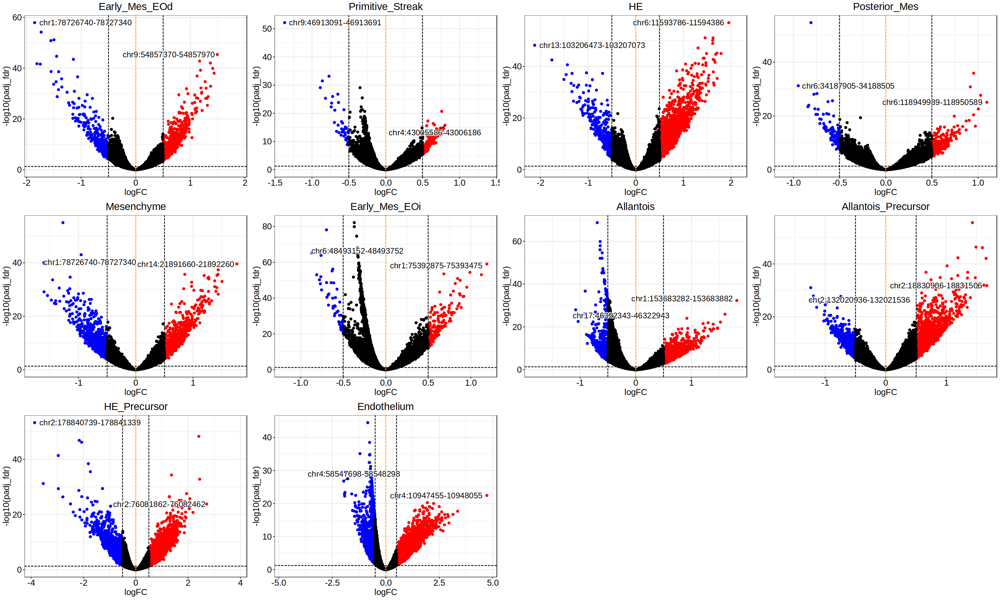

In [173]:
options(repr.plot.width=25, repr.plot.height=15)
ggarrange(plotlist=plots)

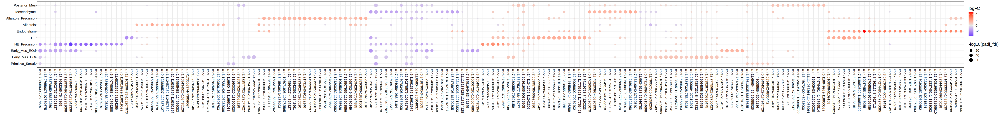

In [102]:
features = unique(DARs[padj_fdr<0.05 & abs(logFC) > 0.5] %>% .[order(-abs(logFC)), ]) %>% .[,head(.SD, 20), by=celltype] %>% .$peak

# Turn dt in matrix
DEGs.mtx = DARs[peak %in% features ,c('peak',  'logFC', 'celltype')] %>% dcast(., celltype ~ peak, value.var = 'logFC')
DEGs.mtx[is.na(DEGs.mtx)] = 0
DEGs.mtx = DEGs.mtx %>% as.data.frame() %>% tibble::column_to_rownames('celltype')

# Cluster genes by logFC
order = hclust(dist(t(DEGs.mtx)))

# prepare data.table for plotting
to.plot = DARs[peak %in% features & padj_fdr < 0.05] %>%
    .[, gene := factor(peak, levels = order$labels[order$order])] %>%
    .[, celltype := factor(celltype, levels = opts$celltype_levels)]

options(repr.plot.width=50, repr.plot.height=6)
ggplot(to.plot, aes(gene, celltype, size=-log10(padj_fdr), col=logFC)) + 
    geom_point() + 
    scale_color_gradient2(low='blue', mid = 'gray90', high='red', name='logFC') + 
    xlab('') + ylab('') + 
    theme_bw() + 
    theme(axis.text.x=element_text(angle=-90, hjust=0, vjust=0.5),
         axis.text=element_text(size=12, color='black'),
         text=element_text(size=15))

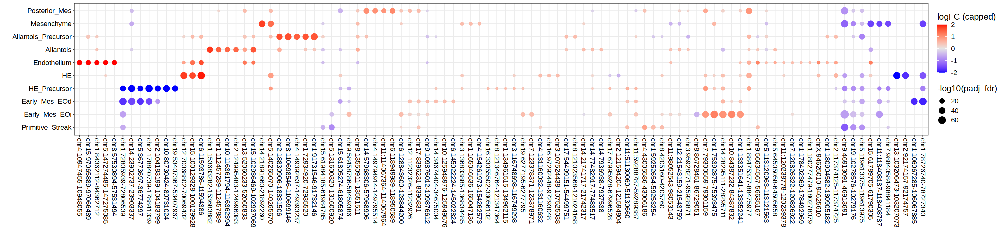

In [106]:
# Get top up & down regulated peaks
top_n = 5
features = c(unique(DARs[padj_fdr<0.05 & abs(logFC) > 0.5] %>% .[order(-abs(logFC)), ]) %>% .[,head(.SD, top_n), by=celltype] %>% .$peak,
             unique(DARs[padj_fdr<0.05 & abs(logFC) > 0.5] %>% .[order(-abs(logFC)), ]) %>% .[,tail(.SD, top_n), by=celltype] %>% .$peak)

# Turn dt in matrix
DEGs.mtx = DARs[peak %in% features ,c('peak',  'logFC', 'celltype')] %>% dcast(., celltype ~ peak, value.var = 'logFC')
DEGs.mtx[is.na(DEGs.mtx)] = 0
DEGs.mtx = DEGs.mtx %>% as.data.frame() %>% tibble::column_to_rownames('celltype')

# Cluster genes by logFC
order = hclust(dist(t(DEGs.mtx)))

# prepare data.table for plotting
to.plot = DARs[peak %in% features & padj_fdr < 0.05] %>%
    .[, gene := factor(peak, levels = order$labels[order$order])] %>%
    .[, celltype := factor(celltype, levels = opts$celltype_levels)] %>% 
    .[, logFC_capped := ifelse(logFC >= 2, 2, 
                               ifelse(logFC <= -2, -2, logFC))]

options(repr.plot.width=25, repr.plot.height=6)
ggplot(to.plot, aes(gene, celltype, size=-log10(padj_fdr), col=logFC_capped)) + 
    geom_point() + 
    scale_color_gradient2(low='blue', mid = 'gray90', high='red', name='logFC (capped)') + 
    xlab('') + ylab('') + 
    theme_bw() + 
    theme(axis.text.x=element_text(angle=-90, hjust=0, vjust=0.5),
         axis.text=element_text(size=12, color='black'),
         text=element_text(size=15))

In [28]:
unique(DARs$celltype)

[1] "Early_Mes_EOd"       "Primitive_Streak"    "HE"                 
 [4] "Posterior_Mes"       "Mesenchyme"          "Early_Mes_EOi"      
 [7] "Allantois"           "Allantois_Precursor" "HE_Precursor"       
[10] "Endothelium"

In [78]:
# write bed & perform HOMER
mclapply(unique(DARs$celltype), function(x){
    tmp = DARs[celltype==x][padj_fdr<0.05][logFC<=-0.25][order(logFC)] %>% 
        .[, chr:=str_split(peak, ':') %>% map_chr(1)] %>%
            .[, start:=as.numeric(str_split(str_split(peak, ':') %>% map_chr(2), '-') %>% map_chr(1))] %>%
            .[, end:=as.numeric(str_split(str_split(peak, ':') %>% map_chr(2), '-') %>% map_chr(2))] %>%
        .[,c('chr', 'start', 'end')] %>% .[,start:=(start+end)/2] %>% .[,end:=start+1]

    fwrite(tmp, sprintf('%s/%s_down.bed', args$outdir, x) , col.names=F, sep='\t')
    
    tmp = DARs[celltype==x][padj_fdr<0.05][logFC>=0.25][order(logFC)] %>% 
        .[, chr:=str_split(peak, ':') %>% map_chr(1)] %>%
            .[, start:=as.numeric(str_split(str_split(peak, ':') %>% map_chr(2), '-') %>% map_chr(1))] %>%
            .[, end:=as.numeric(str_split(str_split(peak, ':') %>% map_chr(2), '-') %>% map_chr(2))] %>%
        .[,c('chr', 'start', 'end')] %>% .[,start:=(start+end)/2] %>% .[,end:=start+1]

    fwrite(tmp, sprintf('%s/%s_up.bed', args$outdir, x) , col.names=F, sep='\t')      
})

[[1]]
NULL

[[2]]
NULL

[[3]]
NULL

[[4]]
NULL

[[5]]
NULL

[[6]]
NULL

[[7]]
NULL

[[8]]
NULL

[[9]]
NULL

[[10]]
NULL

In [83]:
args$outdir

[1] "/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/results/rna_atac/differential/Accessibility/"

In [87]:
# Motif search using Homer
mclapply(unique(DARs$celltype), function(x){
    cmd = sprintf('/rds/project/rds-SDzz0CATGms/users/bt392/software/homer/bin/findMotifsGenome.pl %s/%s_up.bed mm10 %s/%s_up/ -size 250 -S 10 -len 6,8 -p 24', 
                       args$outdir, x,
                         args$outdir, x)
    system(cmd)
    
    cmd = sprintf('/rds/project/rds-SDzz0CATGms/users/bt392/software/homer/bin/findMotifsGenome.pl %s/%s_down.bed mm10 %s/%s_down/ -size 250 -S 10 -len 6,8 -p 24', 
                       args$outdir, x,
                         args$outdir, x)
    system(cmd)
},mc.cores=12)

[[1]]
[1] 0

[[2]]
[1] 0

[[3]]
[1] 0

[[4]]
[1] 0

[[5]]
[1] 0

[[6]]
[1] 0

[[7]]
[1] 0

[[8]]
[1] 0

[[9]]
[1] 0

[[10]]
[1] 0

In [75]:
nrow(DARs[celltype=='Early_Mes_EOd'][padj_fdr<0.05][logFC>=0.25][order(logFC)])

[1] 4400

In [76]:
test = DARs[celltype=='Early_Mes_EOd'][padj_fdr<0.05][logFC<=-0.25][order(logFC)] %>% 
    .[, chr:=str_split(peak, ':') %>% map_chr(1)] %>%
        .[, start:=as.numeric(str_split(str_split(peak, ':') %>% map_chr(2), '-') %>% map_chr(1))] %>%
        .[, end:=as.numeric(str_split(str_split(peak, ':') %>% map_chr(2), '-') %>% map_chr(2))] %>%
    .[,c('chr', 'start', 'end')] %>% .[,start:=(start+end)/2] %>% .[,end:=start+1]

head(test)
fwrite(test, file.path(args$outdir, 'test.bed') , col.names=F, sep='\t')

chr,start,end
<chr>,<dbl>,<dbl>
chr1,78727040,78727041
chr1,106067585,106067586
chr5,36773997,36773998
chr1,72806239,72806240
chr14,23903037,23903038
chr2,178841039,178841040


#### Motif enrichment

In [33]:
# Functions
plot_enr_heatmap = function(enrichMotifs, ntop=25) {
    heatmapEM <- plotEnrichHeatmap(enrichMotifs, n = ntop, cutOff=5, returnMatrix = TRUE)

    enriched.dt = melt(as.data.table(heatmapEM, keep.rownames=T) %>% setnames('rn', 'TF'), id.vars = c("TF")) %>%
        .[order(-value)] %>% .[,TF:=strsplit(TF, '_') %>% map_chr(1)]

    keep_tfs = enriched.dt %>% .[,variable:=factor(variable, levels=opts$celltype_levels )] %>% .[order(variable)] %>% .[, head(.SD, ntop),  by=variable] %>% .$TF   
    enriched.dt = enriched.dt[TF %in% keep_tfs] %>% .[order( -value)] %>% 
        #.[,TF:=strsplit(TF, '_') %>% map_chr(1)] %>%
         .[,TF:=factor(TF, levels=unique(keep_tfs))] %>%
        .[,variable:=factor(variable, levels=opts$celltype_levels )]
    
    p = ggplot(enriched.dt, aes(TF, variable, fill=value)) + 
    geom_tile(col='black') +
    scale_fill_gradient(low='white', high='darkblue', name='Norm. Enrichment -log10(P-adj) [0-max]') +
    theme_void() + theme(text=element_text(size=15), 
                         axis.text.x=element_text(angle=-90,hjust=0,vjust=0.5, size=15), 
                         axis.text.y=element_text(hjust=0),
                        legend.position='bottom')
p
    return(p)
}

In [32]:
# Get markers summarized experiment object
test_cells = c(sample(cell_metadata.dt[genotype=='KO', cell], 100),
               sample(cell_metadata.dt[genotype=='WT', cell], 100))
tmp = ArchRProject[test_cells]
tmp@cellColData$genotype = c(rep('KO', 100), rep('WT', 100))

markers = suppressMessages(getMarkerFeatures(
          ArchRProj = tmp, 
          useMatrix = "PeakMatrix",
          groupBy = "genotype",
          testMethod = "wilcoxon",
          binarize=FALSE,
          bias = c("TSSEnrichment", "log10(nFrags)"),
          useGroups = 'KO',
          bgdGroups = 'WT',
          verbose= FALSE))

In [160]:
enrich_full = list()
for(i in unique(DARs$celltype)){
        tmp1 = DARs[celltype==i][match(peakSet$feature, peak)] %>%
                        .[,c('Log2FC', 'FDR'):=list(ifelse(is.na(logFC), 0, logFC),
                                                    ifelse(is.na(padj_fdr), 1, padj_fdr))]
    tmp2 = markers
    tmp2@assays@data$Log2FC = data.frame('x'=tmp1$Log2FC)
    tmp2@assays@data$FDR = data.frame('x'=tmp1$FDR)
    colnames(tmp2) = i
    enrich_full[[i]] = tmp2
}
enrich_full = do.call('cbind', enrich_full)

In [183]:
enrich_full = list()
for(i in unique(DARs$celltype)){
        tmp1 = DARs[celltype==i][match(peakSet$feature, peak)] %>%
                        .[,c('Log2FC', 'FDR'):=list(ifelse(is.na(logFC), 0, logFC),
                                                    ifelse(is.na(padj_fdr), 1, padj_fdr))] %>% 
                        .[,c('Log2FC', 'FDR'):=list(ifelse(Log2FC<0.5, 0, Log2FC),
                                                    ifelse(FDR>0.05, 1, FDR))]
    tmp2 = markers
    tmp2@assays@data$Log2FC = data.frame('x'=tmp1$Log2FC)
    tmp2@assays@data$FDR = data.frame('x'=tmp1$FDR)
    colnames(tmp2) = i
    enrich_full[[i]] = tmp2
}
enrich_full = do.call('cbind', enrich_full)

ArchR logging to : ArchRLogs/ArchR-plotEnrichHeatmap-1243545b7e2a29-Date-2023-05-27_Time-16-45-01.log
If there is an issue, please report to github with logFile!



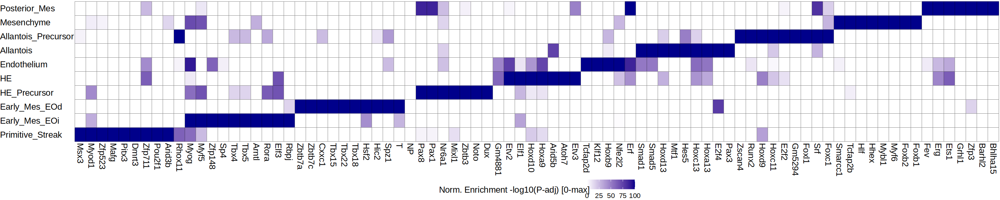

In [216]:
enrichMotifs <- suppressMessages(peakAnnoEnrichment(
    seMarker = enrich_full,
    ArchRProj = ArchRProject,
    peakAnnotation = "Motif_cisbp",
    cutOff = "FDR <= 0.1 & Log2FC > 0.5"
  ))

options(repr.plot.width=25, repr.plot.height=5)
plot_enr_heatmap(enrichMotifs, ntop = 10)

In [218]:
enrichMotifs <- suppressMessages(peakAnnoEnrichment(
    seMarker = enrich_full,
    ArchRProj = ArchRProject,
    peakAnnotation = "Motif_cisbp",
    cutOff = "FDR <= 0.1 & Log2FC <= -0.5"
  ))

options(repr.plot.width=15, repr.plot.height=5)
plot_enr_heatmap(enrichMotifs, ntop = 50)

ArchR logging to : ArchRLogs/ArchR-plotEnrichHeatmap-1243541c97a98b-Date-2023-05-27_Time-16-46-11.log
If there is an issue, please report to github with logFile!



ERROR: Error in plotEnrichHeatmap(enrichMotifs, n = ntop, cutOff = 0, returnMatrix = TRUE): No enrichments found for your cutoff!


In [219]:
ArchRProject@peakAnnotation$silicoChIP_CISBP = list(Name = 'silicoChIP_CISBP',
                                            motifs = NA,
                                            Positions = "/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/processed/atac/archR/Annotations/silicoChIP_CISBP-Positions-In-Peaks.rds",
                                             Matches = "/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/processed/atac/archR/Annotations/silicoChIP_CISBP-Matches-In-Peaks.rds")

ArchR logging to : ArchRLogs/ArchR-plotEnrichHeatmap-12435424647889-Date-2023-05-27_Time-16-48-09.log
If there is an issue, please report to github with logFile!



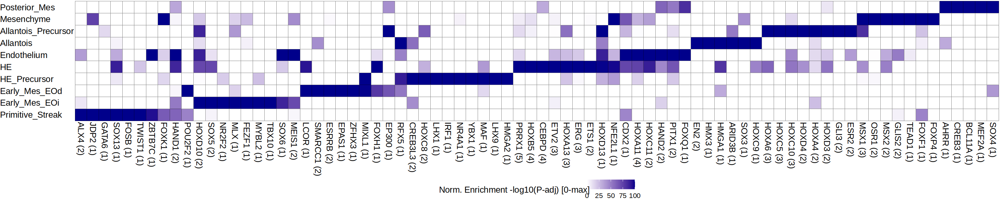

In [221]:
enrichMotifs <- suppressMessages(peakAnnoEnrichment(
    seMarker = enrich_full,
    ArchRProj = ArchRProject,
    peakAnnotation = "silicoChIP_CISBP",
    cutOff = "FDR <= 0.1 & Log2FC >=0.5"
  ))

options(repr.plot.width=25, repr.plot.height=5)
plot_enr_heatmap(enrichMotifs, ntop = 10)

In [222]:
enrichMotifs <- suppressMessages(peakAnnoEnrichment(
    seMarker = enrich_full,
    ArchRProj = ArchRProject,
    peakAnnotation = "silicoChIP_CISBP",
    cutOff = "FDR <= 0.1 & Log2FC <= -0.5"
  ))

options(repr.plot.width=25, repr.plot.height=5)
plot_enr_heatmap(enrichMotifs, ntop = 10)

ArchR logging to : ArchRLogs/ArchR-plotEnrichHeatmap-124354ed99688-Date-2023-05-27_Time-16-48-25.log
If there is an issue, please report to github with logFile!



ERROR: Error in plotEnrichHeatmap(enrichMotifs, n = ntop, cutOff = 0, returnMatrix = TRUE): No enrichments found for your cutoff!


In [224]:
ArchRProject@peakAnnotation$silicoChIP_JASPAR = list(Name = 'silicoChIP_JASPAR',
                                            motifs = NA,
                                            Positions = "/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/processed/atac/archR/Annotations/silicoChIP_JASPAR-Positions-In-Peaks.rds",
                                             Matches = "/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/processed/atac/archR/Annotations/silicoChIP_JASPAR-Matches-In-Peaks.rds")

In [225]:
enrichMotifs <- suppressMessages(peakAnnoEnrichment(
    seMarker = enrich_full,
    ArchRProj = ArchRProject,
    peakAnnotation = "silicoChIP_JASPAR",
    cutOff = "FDR <= 0.1 & Log2FC <= -0.5"
  ))

options(repr.plot.width=25, repr.plot.height=5)
plot_enr_heatmap(enrichMotifs, ntop = 10)

ArchR logging to : ArchRLogs/ArchR-plotEnrichHeatmap-124354677af78b-Date-2023-05-27_Time-16-48-58.log
If there is an issue, please report to github with logFile!



ERROR: Error in plotEnrichHeatmap(enrichMotifs, n = ntop, cutOff = 0, returnMatrix = TRUE): No enrichments found for your cutoff!


ArchR logging to : ArchRLogs/ArchR-plotEnrichHeatmap-1243546d3e0b67-Date-2023-05-27_Time-16-49-13.log
If there is an issue, please report to github with logFile!



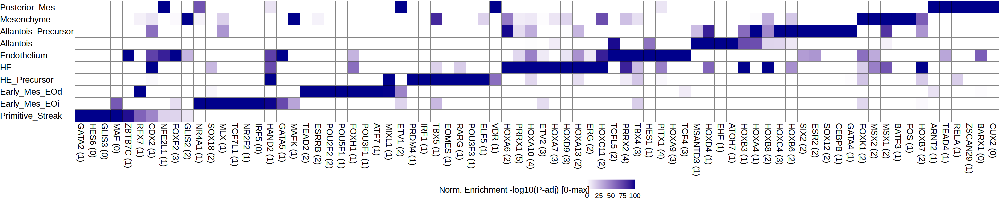

In [226]:
enrichMotifs <- suppressMessages(peakAnnoEnrichment(
    seMarker = enrich_full,
    ArchRProj = ArchRProject,
    peakAnnotation = "silicoChIP_JASPAR",
    cutOff = "FDR <= 0.1 & Log2FC >= 0.5"
  ))

options(repr.plot.width=25, repr.plot.height=5)
plot_enr_heatmap(enrichMotifs, ntop = 10)

In [234]:
enrichMotifs

class: SummarizedExperiment 
dim: 417 10 
metadata(0):
assays(10): mlog10Padj mlog10p ... CompareFrequency feature
rownames(417): ALX3 ARNT2 ... ZKSCAN5 ZSCAN29
rowData names(0):
colnames(10): Early_Mes_EOd Primitive_Streak ... HE_Precursor
  Endothelium
colData names(0):

motif,celltype,mlog10Padj
<chr>,<fct>,<dbl>
Tcfap2a_1,Early_Mes_EOd,0.0000000
Tcfap2b_2,Early_Mes_EOd,0.0000000
Tcfap2c_3,Early_Mes_EOd,0.2534575
Tcfap2e_4,Early_Mes_EOd,0.0000000
Tcfap2d_5,Early_Mes_EOd,0.0000000
Arid3b_6,Early_Mes_EOd,0.0000000


motif,celltype,mlog10Padj
<chr>,<fct>,<dbl>
Zscan4_140,Early_Mes_EOd,0
Etv2_270,Early_Mes_EOd,0
Elf1_285,Early_Mes_EOd,0
Gm4881_293,Early_Mes_EOd,0
Zscan4_140,Primitive_Streak,0
Etv2_270,Primitive_Streak,0


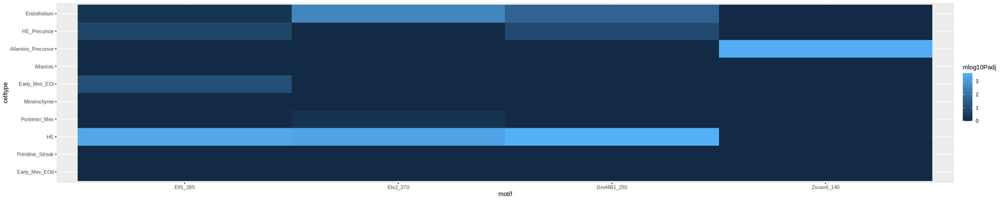

In [245]:
enrichMotifs <- suppressMessages(peakAnnoEnrichment(
    seMarker = enrich_full,
    ArchRProj = ArchRProject,
    peakAnnotation = "Motif_cisbp",
    cutOff = "FDR <= 0.1 & Log2FC >= 0.5"
  ))

test = as.data.table(assay(enrichMotifs, 'mlog10Padj'))
colnames(test) = colnames(enrichMotifs) 
test = test %>% 
    .[, motif := rownames(enrichMotifs)] %>% 
    melt(., id.vars = 'motif', variable.name = "celltype", value.name = 'mlog10Padj')
head(test)
keep = test[mlog10Padj>3, motif]
tmp = test[motif %in% keep]
head(tmp)
ggplot(tmp, aes(motif, celltype, fill=mlog10Padj)) + 
    geom_tile()

# Pseudobulk less strict filtering

In [24]:
# ct =  'Early_Mes_EOd'
# min.expr = 0.5
# min.cdr = 0.2

DARs = mclapply(keep, function(ct, min.expr = 0, min.cdr = 0.05){
    tmp <- sprintf("%s_%s",ct,opts$groups)
    if (any(!tmp%in%unique(sce_full$celltype_genotype))) {
      warning("...")
      out <- data.table(peak=NA, logFC=NA, padj_fdr=NA, mean_groupA = NA, mean_groupB = NA, cdr_groupA=NA, cdr_groupB=NA)
    } else {
      sce <- sce_full[,sce_full$celltype_v1 %in% ct]
      singlecell_sce <- atac.sce[,atac.sce$celltype_v1 %in% ct]
      singlecell_sce$celltype_genotype = sprintf("%s_%s",ct,singlecell_sce$genotype)
        # subset genotypes
        stopifnot(opts$groups%in%sce$genotype)
        sce$genotype <- factor(sce$genotype, levels=opts$groups)

        #######################################
        ## Calculate Cellular Detection Rate ##
        #######################################

        expr.dt <- data.table(
          peak = rownames(atac.sce),
          mean_groupA = rowMeans(logcounts(sce[,sce$genotype == args$groupA])) %>% round(2),
          mean_groupB = rowMeans(logcounts(sce[,sce$genotype == args$groupB])) %>% round(2),
          cdr_groupA = rowMeans(counts(singlecell_sce[,singlecell_sce$genotype == args$groupA])>0) %>% round(2),
          cdr_groupB = rowMeans(counts(singlecell_sce[,singlecell_sce$genotype == args$groupB])>0) %>% round(2)
        )

        #######################
        ## Feature selection ##
        #######################
        # Filter features
        features.to.use <- expr.dt[mean_groupA>=min.expr | mean_groupB>=min.expr,][cdr_groupA>=min.cdr | cdr_groupB>=min.cdr,peak]
        message(ct, ' with ', length(features.to.use), ' regions')
        
        ################################################
        ## Differential expression testing with edgeR ##
        ################################################

        # Convert SCE to DGEList
        sce_edger <- scran::convertTo(sce[features.to.use,], type="edgeR")
        
        # Calculate Normalisation Factors
        sce_edger <- calcNormFactors(sce_edger)
        
        # Define design matrix (with intercept)
        design <- model.matrix(~sce$genotype)

        # Estimate dispersions
        sce_edger  <- estimateDisp(sce_edger,design)

        # Fit GLM
        fit <- glmQLFit(sce_edger,design)

        # Likelihood ratio test
        lrt <- glmQLFTest(fit)

        # Construct output data.frame
        out <- topTags(lrt, n=nrow(lrt))$table %>% as.data.table(keep.rownames=T) %>%
          .[,idx:=NULL] %>% 
          setnames(c("peak","logFC","logCPM","LR","p.value","padj_fdr")) %>%
          .[,c("logCPM","LR","p.value"):=NULL] %>%
          .[,c("padj_fdr","logFC"):=list(signif(padj_fdr,digits=3), round(logFC,3))] %>%
          merge(expr.dt, by="peak", all.y=TRUE) %>%
          setorder(padj_fdr, na.last=T)
    }
    out = out %>% .[,celltype:=ct]
    return(out)
}, mc.cores=12) %>% rbindlist(., fill=TRUE)

In [25]:
fwrite(DARs, sprintf('%s/DARs_edgeR_pb_lax.txt.gz', args$outdir))

In [27]:
head(DARs[celltype=='Early_Mes_EOd'][order(logFC)])

peak,logFC,padj_fdr,mean_groupA,mean_groupB,cdr_groupA,cdr_groupB,celltype
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
chr4:109797375-109797975,-5.368,6.13e-20,2.11,0.10,0.06,0.01,Early_Mes_EOd
chr2:57613684-57614284,-4.908,1.51e-15,1.77,0.11,0.05,0.01,Early_Mes_EOd
chr10:70452581-70453181,-4.708,8.00e-23,2.35,0.20,0.07,0.01,Early_Mes_EOd
chr13:36524915-36525515,-4.475,6.74e-16,1.86,0.15,0.05,0.01,Early_Mes_EOd
chr8:90555105-90555705,-4.109,7.20e-21,2.34,0.30,0.07,0.01,Early_Mes_EOd
chr16:22668059-22668659,-3.988,1.48e-14,1.81,0.21,0.05,0.01,Early_Mes_EOd


In [28]:
plots = mclapply(keep, function(x){
    tmp = DARs[celltype==x][!is.na(logFC)]
    p = volcano_plot(tmp, ntop=0, title=x, logFC_thr=0.5)
    return(p)
})

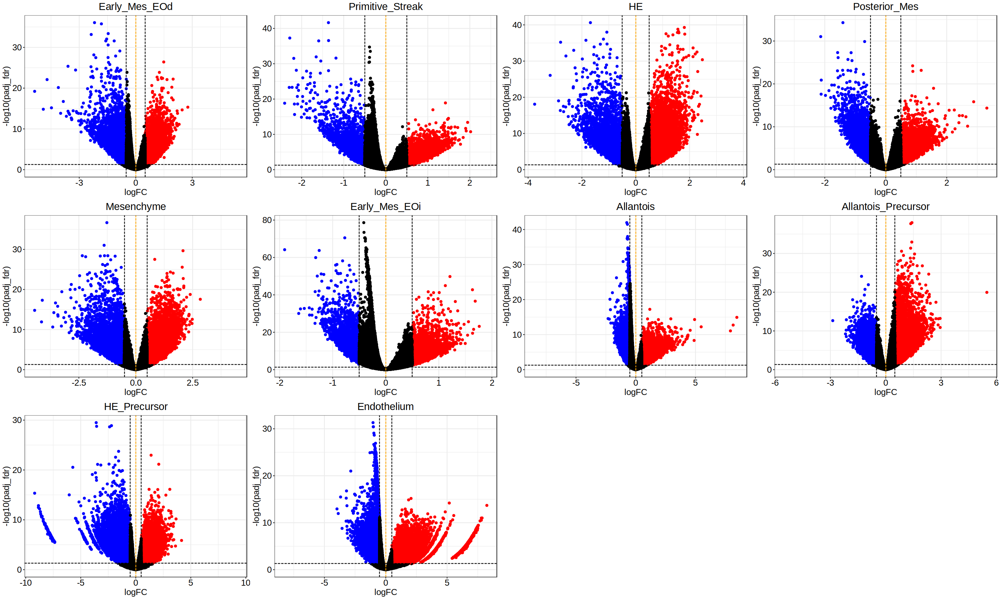

In [29]:
options(repr.plot.width=25, repr.plot.height=15)
ggarrange(plotlist=plots)

In [34]:
enrich_full = list()
for(i in unique(DARs$celltype)){
        tmp1 = DARs[celltype==i][match(peakSet$feature, peak)] %>%
                        .[,c('Log2FC', 'FDR'):=list(ifelse(is.na(logFC), 0, logFC),
                                                    ifelse(is.na(padj_fdr), 1, padj_fdr))] %>% 
                        .[,c('Log2FC', 'FDR'):=list(ifelse(Log2FC<0.5, 0, Log2FC),
                                                    ifelse(FDR>0.05, 1, FDR))]
    tmp2 = markers
    tmp2@assays@data$Log2FC = data.frame('x'=tmp1$Log2FC)
    tmp2@assays@data$FDR = data.frame('x'=tmp1$FDR)
    colnames(tmp2) = i
    enrich_full[[i]] = tmp2
}
enrich_full = do.call('cbind', enrich_full)

In [45]:
enrichMotifs <- suppressMessages(peakAnnoEnrichment(
    seMarker = enrich_full,
    ArchRProj = ArchRProject,
    peakAnnotation = "Motif_JASPAR2020",
    cutOff = "FDR <= 1e-10 & Log2FC > 1"
  ))

options(repr.plot.width=25, repr.plot.height=5)
plot_enr_heatmap(enrichMotifs, ntop = 10)

ArchR logging to : ArchRLogs/ArchR-plotEnrichHeatmap-329d4c37f93a38-Date-2023-06-03_Time-16-28-12.log
If there is an issue, please report to github with logFile!



ERROR: Error in plotEnrichHeatmap(enrichMotifs, n = ntop, cutOff = 5, returnMatrix = TRUE): No enrichments found for your cutoff!


In [44]:
enrichMotifs <- suppressMessages(peakAnnoEnrichment(
    seMarker = enrich_full,
    ArchRProj = ArchRProject,
    peakAnnotation = "Motif_JASPAR2020",
    cutOff = "FDR <= 0.05 & Log2FC <= -1"
  ))

options(repr.plot.width=15, repr.plot.height=5)
plot_enr_heatmap(enrichMotifs, ntop = 50)

ArchR logging to : ArchRLogs/ArchR-plotEnrichHeatmap-329d4c7126d13a-Date-2023-06-03_Time-16-27-54.log
If there is an issue, please report to github with logFile!



ERROR: Error in plotEnrichHeatmap(enrichMotifs, n = ntop, cutOff = 5, returnMatrix = TRUE): No enrichments found for your cutoff!


### EdgeR single-cell

In [9]:
atac.sce = getMatrixFromProject(
                  ArchRProj = ArchRProject,
                  useMatrix = "PeakMatrix")

ArchR logging to : ArchRLogs/ArchR-getMatrixFromProject-329d4c12a01e88-Date-2023-06-03_Time-15-26-34.log
If there is an issue, please report to github with logFile!



In [29]:
args$groupA = 'WT'
args$groupB = 'KO'
args$celltypes = unique(opts$clusters2celltypes)[unique(opts$clusters2celltypes) != 'Blood_Progenitor']
opts$groups = c(args$groupA, args$groupB)

keep = args$celltypes 

In [15]:
sce = as.SingleCellExperiment(seurat)

In [16]:
sample_metadata = meta[day!='D3']

In [32]:
# Single cell DEG function
doDiffExpr <- function(sce, groups, min.expr = 0.3, min.cdr = 0.3) {
    
  # Sanity checks
  if (!is(sce, "SingleCellExperiment")) stop("'sce' has to be an instance of SingleCellExperiment")
  stopifnot(length(groups)==2)

  # Filter genes by detection rate per group
#  cdr_A <- rowMeans(counts(sce[,sce$genotype==opts$groups[1]])>0) >= min_detection_rate_per_group
#  cdr_B <- rowMeans(counts(sce[,sce$genotype==opts$groups[2]])>0) >= min_detection_rate_per_group
    expr.dt <- data.table(
        gene = rownames(rna.sce),
        mean_groupA = rowMeans(logcounts(sce[,sce$genotype == args$groupA])) %>% round(2),
        mean_groupB = rowMeans(logcounts(sce[,sce$genotype == args$groupB])) %>% round(2),
        cdr_groupA = rowMeans(logcounts(sce[,sce$genotype == args$groupA])>0) %>% round(2),
        cdr_groupB = rowMeans(logcounts(sce[,sce$genotype == args$groupB])>0) %>% round(2)
    )

    #######################
    ## Feature selection ##
    #######################
    # filter genes
    genes.to.use <- expr.dt[mean_groupA>=min.expr | mean_groupB>=min.expr,][cdr_groupA>=min.cdr | cdr_groupB>=min.cdr,gene]
    genes.to.use = genes.to.use[!genes.to.use %in% genes.to.use[grep("*Rik|^Gm|^Rps|^Rpl|^Olfr", genes.to.use)]]  
    message(length(genes.to.use))
  #out <- .edgeR(sce[cdr_B | cdr_A,]) %>% .[,log_padj_fdr:= -log10(padj_fdr)]
  out <- .edgeR(sce[genes.to.use,]) %>% .[,log_padj_fdr:= -log10(padj_fdr)]
  
  return(out)
}


.edgeR <- function(sce) {
  
  # Convert SCE to DGEList
  sce$genotype <- factor(sce$genotype, levels=opts$groups)
  sce_edger <- scran::convertTo(sce, type="edgeR")
    
  # Calculate Normalisation Factors
  sce_edger <- calcNormFactors(sce_edger)

  design <- model.matrix(~sce$genotype) # might need to modify to only use this if celltype found in both experiments
  # Estimate dispersions
  sce_edger  <- estimateDisp(sce_edger,design)
  
  # Fit GLM
  fit <- glmQLFit(sce_edger,design)
  
  # Likelihood ratio test
  lrt <- glmQLFTest(fit)
  
  # Construct output data.frame
  out <- topTags(lrt, n=nrow(lrt))$table %>% as.data.table(keep.rownames=T) %>%
    setnames(c("gene","logFC","logCPM","LR","p.value","padj_fdr")) %>%
    .[,c("logCPM","LR"):=NULL]
  
  return(out)
}

In [35]:
# Single_cell

sce$group = meta$genotype
opts$groups = c('WT', 'KO')
sce$group = factor(sce$group, levels = opts$groups)

DEGs = mclapply(keep, function(x){     #unique(meta$celltype.mapped)
    # Only keep cell types with at least 20 cells in both KO and WT
    if(!TRUE %in% as.vector(as.data.frame(table(meta[celltype_v1==x, genotype]))$Freq<20) & 
       length(unique(meta[celltype_v1==x, genotype]))==2){
        message(x)
        sce_deg = sce[, meta$celltype_v1==x]
            out <- doDiffExpr(sce_deg, opts$groups) %>%
              # Add sample statistics
              .[,c("groupA_N","groupB_N"):=list(table(sce_deg$group)[1],table(sce_deg$group)[2])]%>% 
              .[,c("groupA","groupB", "celltype"):=list(opts$groups[1],opts$groups[2],x)]%>%  
              # Calculate statistical significance
              .[, sig := (padj_fdr<=0.05 & abs(logFC)>=1)] %>%
              .[is.na(sig),sig:=FALSE] %>% 
              setorder(-sig, padj_fdr, na.last=T) %>%
              # Add celltype
                .[,celltype:=x]

            # Parse columns
            out[,c("p.value","padj_fdr","logFC","log_padj_fdr"):=list(signif(p.value,digits=3), signif(padj_fdr,digits=3), round(logFC,3),round(log_padj_fdr,3))]
            return(out)
            } 
        }, mc.cores=12) %>% rbindlist()


In [36]:
fwrite(DEGs, sprintf('%s/DEGs_edgeR_sc.txt.gz', args$outdir))

In [70]:
DEGs = fread(sprintf('%s/DEGs_edgeR_sc.txt.gz', args$outdir))

In [71]:
DEGs = DEGs[!gene %in% c('Hba-x', 'Hba-a1', 'Hba-a2', 'Hbb-bh1') ]

In [74]:
plots = lapply(keep, function(x){
    tmp = DEGs[celltype==x][!is.na(logFC)]
    p = volcano_plot(tmp, ntop=10, title=x, logFC_thr=0.5)
    return(p)
})

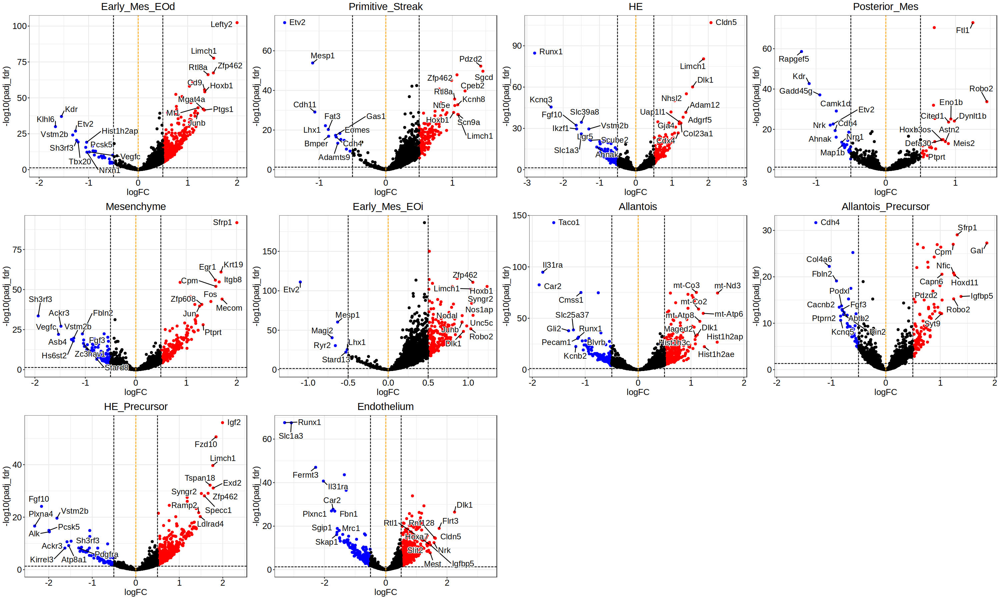

In [75]:
options(repr.plot.width=25, repr.plot.height=15)
ggarrange(plotlist=plots)

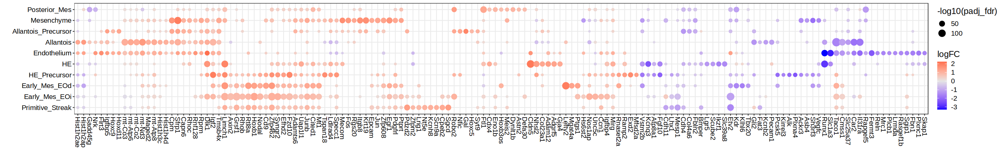

In [76]:
features = unique(DEGs[padj_fdr<0.05 & abs(logFC) > 0.75] %>% .[order(-abs(logFC)), ]) %>% .[,head(.SD, 20), by=celltype] %>% .$gene

# Turn dt in matrix
DEGs.mtx = DEGs[gene %in% features ,c('gene',  'logFC', 'celltype')] %>% dcast(., celltype ~ gene, value.var = 'logFC')
DEGs.mtx[is.na(DEGs.mtx)] = 0
DEGs.mtx = DEGs.mtx %>% as.data.frame() %>% tibble::column_to_rownames('celltype')

# Cluster genes by logFC
order = hclust(dist(t(DEGs.mtx)))

# prepare data.table for plotting
to.plot = DEGs[gene %in% features & padj_fdr < 0.05] %>%
    .[, gene := factor(gene, levels = order$labels[order$order])] %>%
    .[, celltype := factor(celltype, levels = opts$celltype_levels)]

options(repr.plot.width=25, repr.plot.height=4)
ggplot(to.plot, aes(gene, celltype, size=-log10(padj_fdr), col=logFC)) + 
    geom_point() + 
    scale_color_gradient2(low='blue', mid = 'gray90', high='red', name='logFC') + 
    xlab('') + ylab('') + 
    theme_bw() + 
    theme(axis.text.x=element_text(angle=-90, hjust=0, vjust=0.5),
         axis.text=element_text(size=12, color='black'),
         text=element_text(size=15))

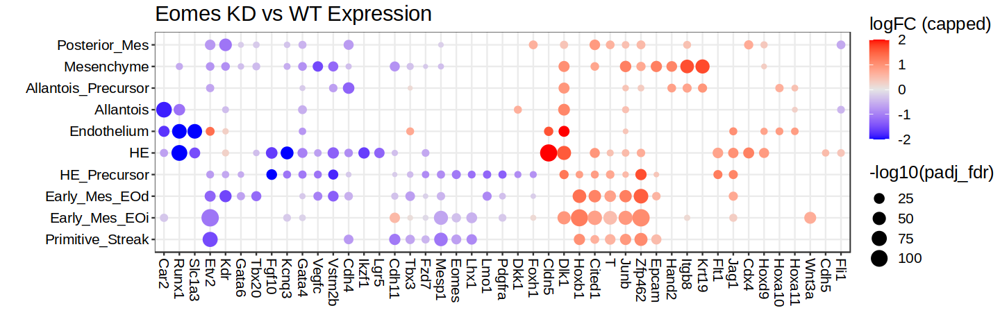

In [77]:
features = c('Kdr', 'Fgf10', 'Runx1', 'Cdh5', 'T', 'Eomes', 'Dlk1', 'Epcam', 
             'Lgr5', 'Itgb8', 'Cited1', 'Flt1', 'Jag1', 'Cdx4', 'Hoxb1', 'Junb', 'Tbx3', 'Pdgfra', 'Mesp1', 'Mesp2', 
             'Vstm2b', 'Kcnq3', 'Hoxd9', 'Hoxa10', 'Etv2',
             'Gata6', 'Gata4', 'Lhx1', 'Fli1', 'Wnt3a', 'Zfp462', 'Vegfc', 'Ikzf1', 'Flt3', 'Hoxa11', 
             'Tbx20', 'Lmo1', 'Foxh1', 'Dkk1', 'Car2', 'Slc1a3', 'Hoxb1', 'Cldn5', 'Hand2', 'Cdh4', 'Krt19','Fzd7', 'Cdh11')

# Turn dt in matrix
DEGs.mtx = DEGs[gene %in% features ,c('gene',  'logFC', 'celltype')] %>% dcast(., celltype ~ gene, value.var = 'logFC')
DEGs.mtx[is.na(DEGs.mtx)] = 0
DEGs.mtx = DEGs.mtx %>% as.data.frame() %>% tibble::column_to_rownames('celltype')

# Cluster genes by logFC
order = hclust(dist(t(DEGs.mtx)))

# prepare data.table for plotting
to.plot = DEGs[gene %in% features & padj_fdr < 0.05] %>%
    .[, gene := factor(gene, levels = order$labels[order$order])] %>%
    .[, celltype := factor(celltype, levels = opts$celltype_levels)] %>% 
    .[, logFC_capped := ifelse(logFC >= 2, 2, 
                               ifelse(logFC <= -2, -2, logFC))]

options(repr.plot.width=12, repr.plot.height=4)
ggplot(to.plot, aes(gene, celltype, size=-log10(padj_fdr), col=logFC_capped)) + 
    geom_point() + 
    scale_color_gradient2(low='blue', mid = 'gray90', high='red', name='logFC (capped)') + 
    xlab('') + ylab('') +
    ggtitle('Eomes KD vs WT Expression') + 
    theme_bw() + 
    theme(axis.text.x=element_text(angle=-90, hjust=0, vjust=0.5),
         axis.text=element_text(size=12, color='black'),
         text=element_text(size=15))

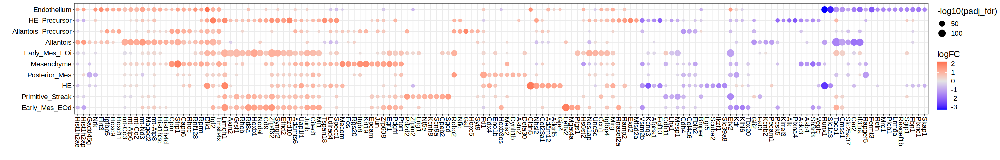

In [80]:
features = unique(DEGs[padj_fdr<0.05 & abs(logFC) > 0.75] %>% .[order(-abs(logFC)), ]) %>% .[,head(.SD, 20), by=celltype] %>% .$gene

# Turn dt in matrix
DEGs.mtx = DEGs[gene %in% features ,c('gene',  'logFC', 'celltype')] %>% dcast(., celltype ~ gene, value.var = 'logFC')
DEGs.mtx[is.na(DEGs.mtx)] = 0
DEGs.mtx = DEGs.mtx %>% as.data.frame() %>% tibble::column_to_rownames('celltype')

# Cluster genes by logFC
order = hclust(dist(t(DEGs.mtx)))

# prepare data.table for plotting
to.plot = DEGs[gene %in% features & padj_fdr < 0.05] %>%
    .[, gene := factor(gene, levels = order$labels[order$order])] %>%
    .[, celltype := factor(celltype, levels = keep)]

options(repr.plot.width=25, repr.plot.height=4)
ggplot(to.plot, aes(gene, celltype, size=-log10(padj_fdr), col=logFC)) + 
    geom_point() + 
    scale_color_gradient2(low='blue', mid = 'gray90', high='red', name='logFC') + 
    xlab('') + ylab('') + 
    theme_bw() + 
    theme(axis.text.x=element_text(angle=-90, hjust=0, vjust=0.5),
         axis.text=element_text(size=12, color='black'),
         text=element_text(size=15))

# Plot ChromVAR

In [7]:
getAvailableMatrices(ArchRProject)

[1] "DeviationMatrix_CISBP"   "DeviationMatrix_JASPAR" 
 [3] "GeneScoreMatrix_TSS"     "GeneScoreMatrix_distal" 
 [5] "MarkerPeaksMatrix"       "PeakMatrix"             
 [7] "PeakMatrix_atlas"        "TileMatrix"             
 [9] "silicoChIPMatrix"        "silicoChIP_CISBPMatrix" 
[11] "silicoChIP_JASPARMatrix"

In [104]:
chromVAR.sce = getMatrixFromProject(
  ArchRProj = ArchRProject,
  useMatrix = "DeviationMatrix_JASPAR")

ArchR logging to : ArchRLogs/ArchR-getMatrixFromProject-33ca365c78507-Date-2023-06-07_Time-00-22-18.log
If there is an issue, please report to github with logFile!

2023-06-07 00:22:33 : Organizing colData, 0.243 mins elapsed.

2023-06-07 00:22:34 : Organizing rowData, 0.259 mins elapsed.

2023-06-07 00:22:34 : Organizing rowRanges, 0.259 mins elapsed.

2023-06-07 00:22:34 : Organizing Assays (1 of 2), 0.259 mins elapsed.

2023-06-07 00:22:37 : Organizing Assays (2 of 2), 0.309 mins elapsed.

2023-06-07 00:22:38 : Constructing SummarizedExperiment, 0.337 mins elapsed.

2023-06-07 00:22:39 : Finished Matrix Creation, 0.355 mins elapsed.



In [105]:
chromVAR.sce = chromVAR.sce[, match(meta$cell, colnames(chromVAR.sce))]

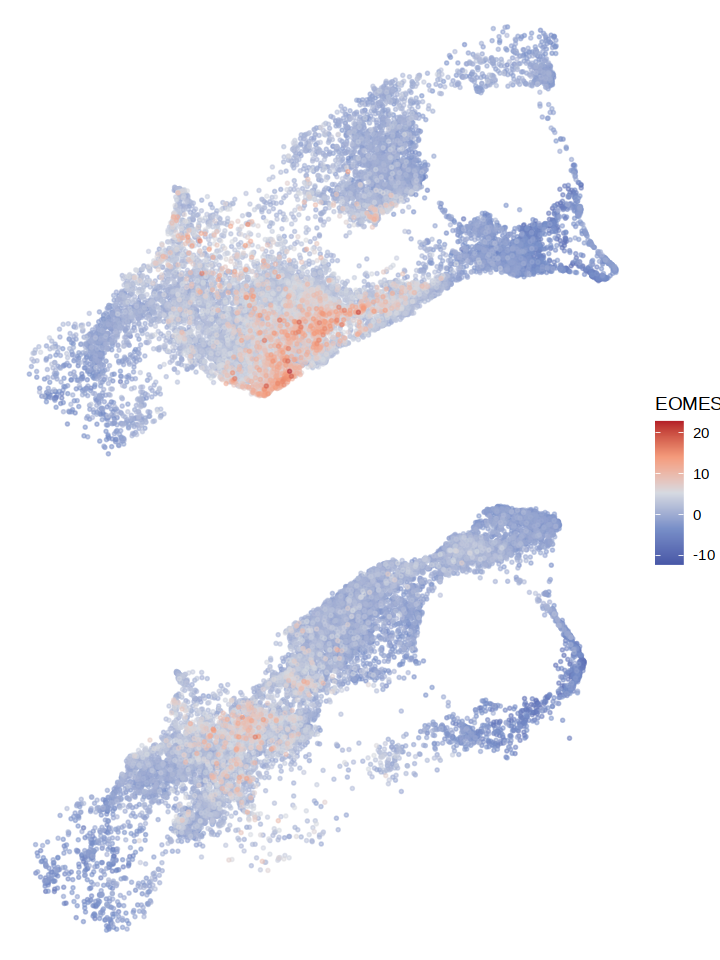

In [54]:
gene = 'EOMES'

meta = meta[match(colnames(chromVAR.sce), cell)]
meta$chromVAR = as.vector(assay(chromVAR.sce[grep(gene, rownames(chromVAR.sce)),], 'z'))
meta = meta[,genotype:=factor(gsub('KO', 'KD', genotype), levels=c('WT', 'KD'))] %>%
    .[order(chromVAR)]
options(repr.plot.width=6, repr.plot.height=8)
ggplot(meta, aes(UMAP1, UMAP2, col=chromVAR)) + 
    geom_point(size=0.5, alpha=0.5) +
    #scale_color_gradient(low='grey80', high='darkblue', name=gene) + 
    scale_color_gradientn(colours=ArchR::ArchRPalettes$coolwarm, name=gene)+
    facet_wrap(~genotype, ncol=1) + 
    theme_void() + 
    theme(strip.text=element_blank())

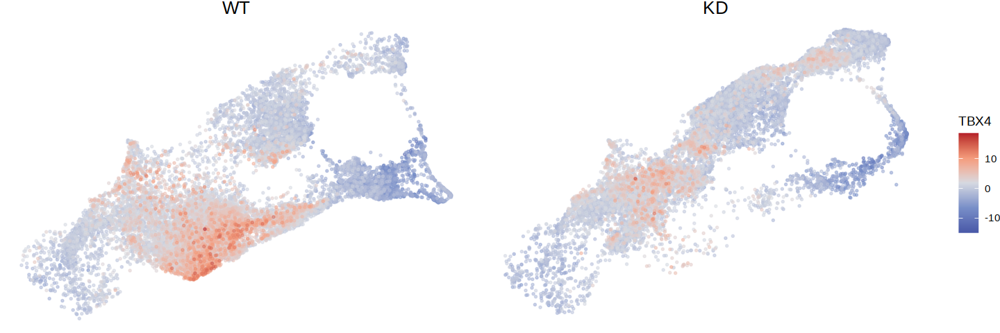

In [55]:
gene = 'TBX4'

meta = meta[match(colnames(chromVAR.sce), cell)]
meta$chromVAR = as.vector(assay(chromVAR.sce[grep(gene, rownames(chromVAR.sce)),], 'z'))
meta = meta[,genotype:=factor(gsub('KO', 'KD', genotype), levels=c('WT', 'KD'))] %>%
    .[order(chromVAR)]
options(repr.plot.width=12, repr.plot.height=4)
ggplot(meta, aes(UMAP1, UMAP2, col=chromVAR)) + 
    geom_point(size=0.5, alpha=0.5) +
    scale_color_gradientn(colours=ArchR::ArchRPalettes$coolwarm, name=gene)+
    facet_wrap(~genotype, ncol=2) + 
    theme_void() + 
    theme(strip.text=element_text(size=15))

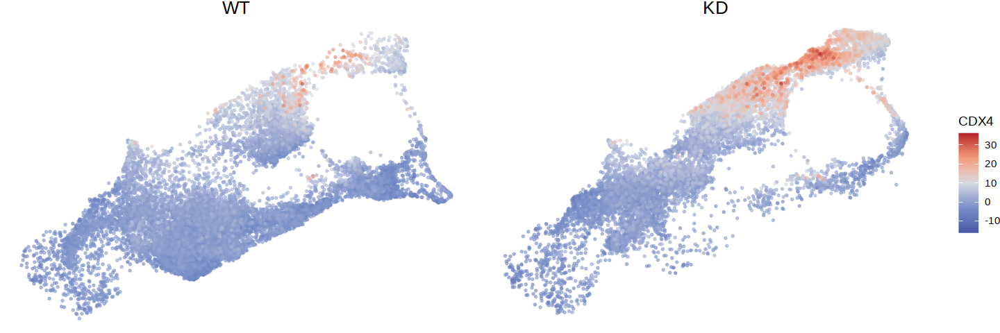

In [56]:
gene = 'CDX4'

meta = meta[match(colnames(chromVAR.sce), cell)]
meta$chromVAR = as.vector(assay(chromVAR.sce[grep(gene, rownames(chromVAR.sce)),], 'z'))
meta = meta[,genotype:=factor(gsub('KO', 'KD', genotype), levels=c('WT', 'KD'))] %>%
    .[order(chromVAR)]
options(repr.plot.width=12, repr.plot.height=4)
ggplot(meta, aes(UMAP1, UMAP2, col=chromVAR)) + 
    geom_point(size=0.5, alpha=0.5) +
    scale_color_gradientn(colours=ArchR::ArchRPalettes$coolwarm, name=gene)+
    facet_wrap(~genotype, ncol=2) + 
    theme_void() + 
    theme(strip.text=element_text(size=15))

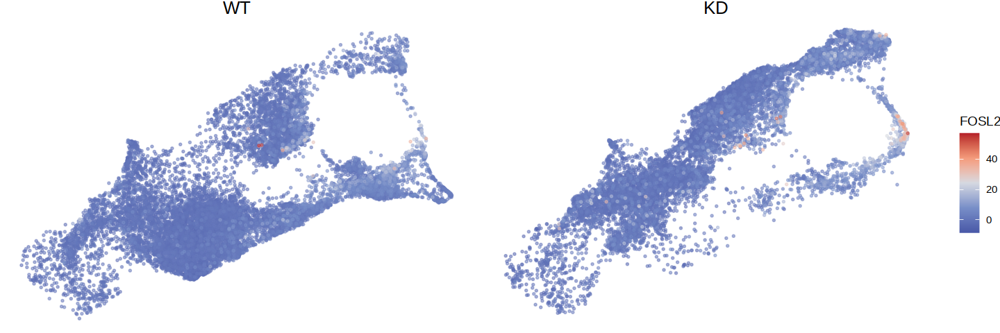

In [116]:
gene = 'FOSL2'

meta = meta[match(colnames(chromVAR.sce), cell)]
meta$chromVAR = as.vector(assay(chromVAR.sce[grep(gene, rownames(chromVAR.sce)),][1], 'z'))
meta = meta[,genotype:=factor(gsub('KO', 'KD', genotype), levels=c('WT', 'KD'))] %>%
    .[order(chromVAR)]
options(repr.plot.width=12, repr.plot.height=4)
ggplot(meta, aes(UMAP1, UMAP2, col=chromVAR)) + 
    geom_point(size=0.5, alpha=0.5) +
    scale_color_gradientn(colours=ArchR::ArchRPalettes$coolwarm, name=gene)+
    facet_wrap(~genotype, ncol=2) + 
    theme_void() + 
    theme(strip.text=element_text(size=15))

#### silicoChIP

In [57]:
chromVAR.sce = getMatrixFromProject(
  ArchRProj = ArchRProject,
  useMatrix = "silicoChIP_JASPARMatrix")

ArchR logging to : ArchRLogs/ArchR-getMatrixFromProject-33ca325a9811-Date-2023-06-06_Time-22-27-42.log
If there is an issue, please report to github with logFile!

2023-06-06 22:27:46 : Organizing colData, 0.062 mins elapsed.

2023-06-06 22:27:47 : Organizing rowData, 0.079 mins elapsed.

2023-06-06 22:27:47 : Organizing rowRanges, 0.079 mins elapsed.

2023-06-06 22:27:47 : Organizing Assays (1 of 2), 0.079 mins elapsed.

2023-06-06 22:27:48 : Organizing Assays (2 of 2), 0.097 mins elapsed.

2023-06-06 22:27:50 : Constructing SummarizedExperiment, 0.134 mins elapsed.

2023-06-06 22:27:51 : Finished Matrix Creation, 0.152 mins elapsed.



In [48]:
chromVAR.sce = chromVAR.sce[, match(meta$cell, colnames(chromVAR.sce))]

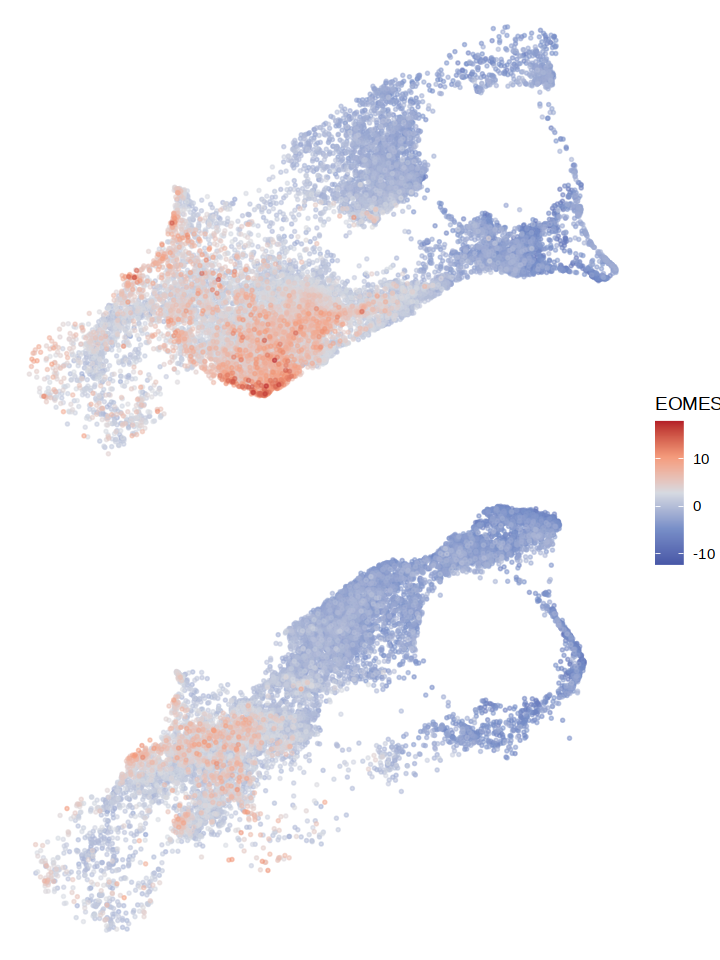

In [49]:
gene = 'EOMES'

meta = meta[match(colnames(chromVAR.sce), cell)]
meta$chromVAR = as.vector(assay(chromVAR.sce[grep(gene, rownames(chromVAR.sce)),], 'z'))
meta = meta[,genotype:=factor(gsub('KO', 'KD', genotype), levels=c('WT', 'KD'))] %>%
    .[order(chromVAR)]
options(repr.plot.width=6, repr.plot.height=8)
ggplot(meta, aes(UMAP1, UMAP2, col=chromVAR)) + 
    geom_point(size=0.5, alpha=0.5) +
    #scale_color_gradient(low='grey80', high='darkblue', name=gene) + 
    scale_color_gradientn(colours=ArchR::ArchRPalettes$coolwarm, name=gene)+
    facet_wrap(~genotype, ncol=1) + 
    theme_void() + 
    theme(strip.text=element_blank())

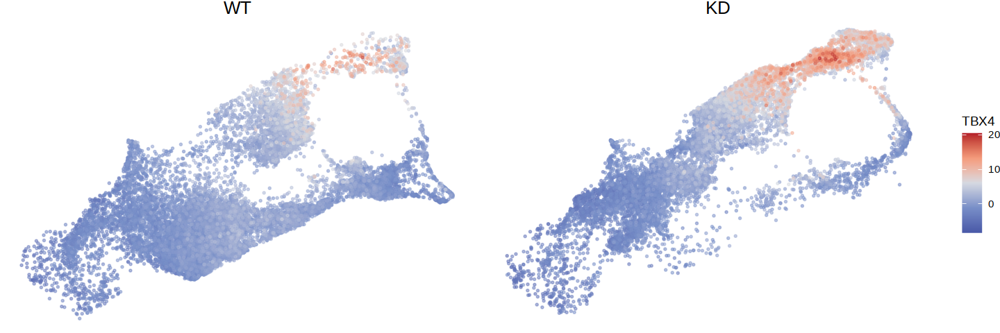

In [50]:
gene = 'TBX4'

meta = meta[match(colnames(chromVAR.sce), cell)]
meta$chromVAR = as.vector(assay(chromVAR.sce[grep(gene, rownames(chromVAR.sce)),], 'z'))
meta = meta[,genotype:=factor(gsub('KO', 'KD', genotype), levels=c('WT', 'KD'))] %>%
    .[order(chromVAR)]
options(repr.plot.width=12, repr.plot.height=4)
ggplot(meta, aes(UMAP1, UMAP2, col=chromVAR)) + 
    geom_point(size=0.5, alpha=0.5) +
    scale_color_gradientn(colours=ArchR::ArchRPalettes$coolwarm, name=gene)+
    facet_wrap(~genotype, ncol=2) + 
    theme_void() + 
    theme(strip.text=element_text(size=15))

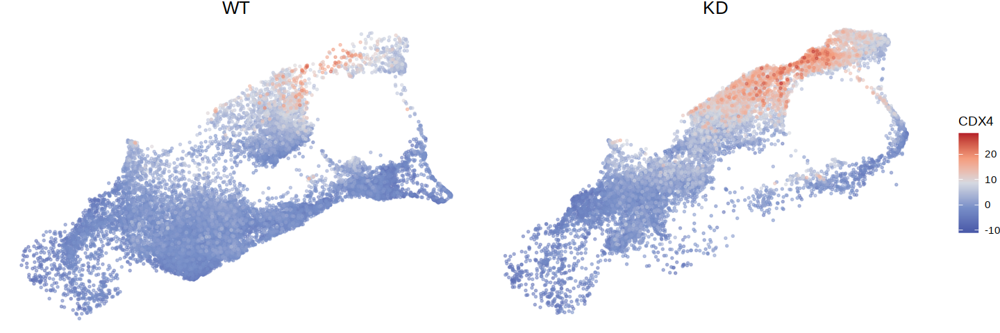

In [51]:
gene = 'CDX4'

meta = meta[match(colnames(chromVAR.sce), cell)]
meta$chromVAR = as.vector(assay(chromVAR.sce[grep(gene, rownames(chromVAR.sce)),], 'z'))
meta = meta[,genotype:=factor(gsub('KO', 'KD', genotype), levels=c('WT', 'KD'))] %>%
    .[order(chromVAR)]
options(repr.plot.width=12, repr.plot.height=4)
ggplot(meta, aes(UMAP1, UMAP2, col=chromVAR)) + 
    geom_point(size=0.5, alpha=0.5) +
    scale_color_gradientn(colours=ArchR::ArchRPalettes$coolwarm, name=gene)+
    facet_wrap(~genotype, ncol=2) + 
    theme_void() + 
    theme(strip.text=element_text(size=15))

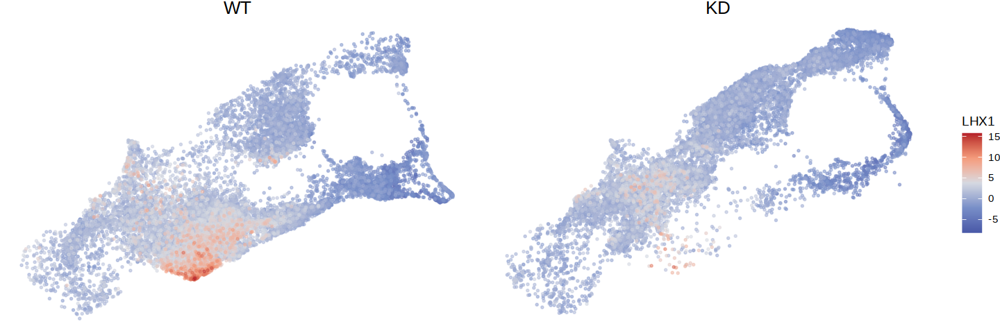

In [103]:
gene = 'LHX1'

meta = meta[match(colnames(chromVAR.sce), cell)]
meta$chromVAR = as.vector(assay(chromVAR.sce[grep(gene, rownames(chromVAR.sce)),], 'z'))
meta = meta[,genotype:=factor(gsub('KO', 'KD', genotype), levels=c('WT', 'KD'))] %>%
    .[order(chromVAR)]
options(repr.plot.width=12, repr.plot.height=4)
ggplot(meta, aes(UMAP1, UMAP2, col=chromVAR)) + 
    geom_point(size=0.5, alpha=0.5) +
    scale_color_gradientn(colours=ArchR::ArchRPalettes$coolwarm, name=gene)+
    facet_wrap(~genotype, ncol=2) + 
    theme_void() + 
    theme(strip.text=element_text(size=15))